# EDA, FE and Classification Models (Scania APS Failure Dataset)
## Shubham Verma

**Follow me on Linkedin:** https://lnkd.in/gfPhvjMR

**Follow me on GitHub:** https://lnkd.in/gky-wyFJ

**For the code please check out my Machine Learning repository on GitHub**

### 1. EDA and FE
1. Data Profiling
2. Stastical analysis
3. Graphical Analysis
4. Data Cleaning
5. Data Scaling

### 2. Dimensionality reduction using PCA 
1. Reduction to 50 features dataset
2. Reduction to 30 features dataset
3. Reduction to 20 features dataset
4. Reduction to 15 features dataset
5. Reduction to 10 features dataset
6. Reduction to 5 features dataset
7. Reduction to 2 features dataset

### 3. Models for all above datasets
1. Logistic Regression 
2. Support Vector Classifier
3. Decision Tree Classifier
4. Random Forest Classifier
5. Bagging Classifier
6. Extra Tree Classifier
7. AdaBoost Classifier
8. Voting Classifier
9. GradientBoost Classifier
10. XGBoost Classifier

### 4. Performance Metrices
1. Accuracy Score
2. Precision Score
3. Recall Score
4. Roc_Auc Score
5. Visualisation of performance metrices

### 5. Hyper parameter Tuning for top 4 models and Performance Metrices
1. Hyperparameter Tuning
2. Performances metrices
3. Visualisation of performance metrices

**Dataset:** https://archive.ics.uci.edu/ml/datasets/APS+Failure+at+Scania+Trucks

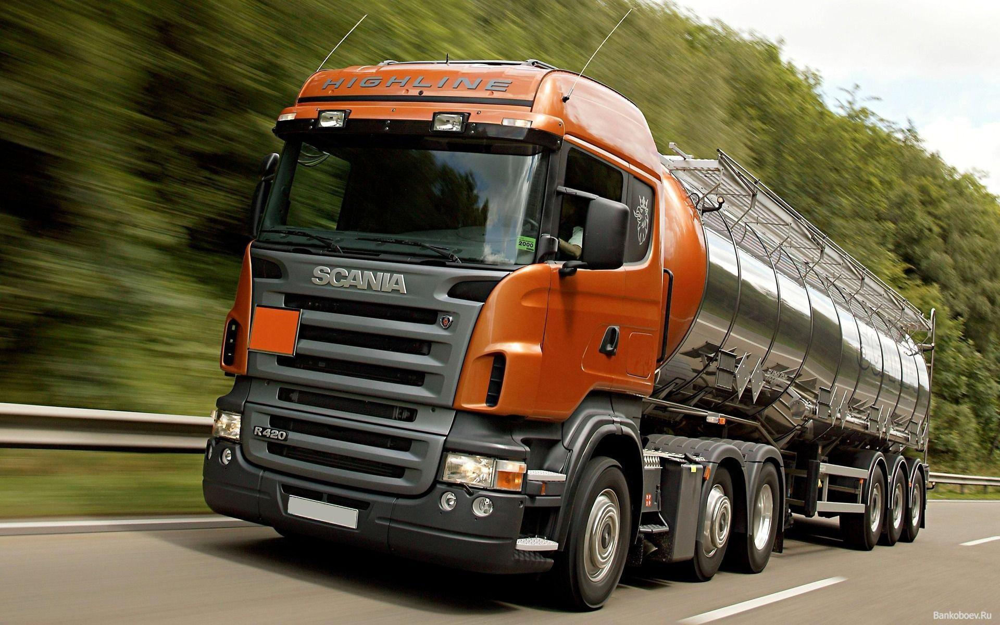

In [1]:
from IPython import display
display.Image("image.jpg")

## <span style='color:red '>1.0 Importing required libraries</span>

In [ ]:
### Pandas and Numpy
import pandas as pd
import numpy as np

### Visualisation libraries
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

### For Q-Q Plot
import scipy.stats as stats

### To ignore warnings
import warnings
warnings.filterwarnings('ignore')

### Machine Learning libraries
import sklearn
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, ExtraTreesClassifier, VotingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score

### To be able to see maximum columns on screen
pd.set_option('display.max_columns', 500)

## <span style='color:red '>2.0 Importing Dataset and Data Cleaning</span>

In [3]:
from google.colab import files
uploaded = files.upload()

Saving aps_failure_training_set.csv to aps_failure_training_set.csv


In [6]:
import io
train = pd.read_csv(io.BytesIO(uploaded['aps_failure_training_set.csv']))
train.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,0,37250,1432864,3664156,1007684,25896,0,2551696,0,0,0,0,0,4933296,3655166,1766008,1132040,0,0,0,0,1012,268,0,0,0,0,0,469014,4239660,703300,755876,0,5374,2108,4114,12348,615248,5526276,2378,4,0,0,2328746,1022304,415432,287230,310246,681504,1118814,3574,0,0,6700214,0,10,108,50,2551696,97518,947550,799478,330760,353400,299160,305200,283680,na,na,na,178540,76698.08,6700214,6700214,6599892,43566,68656,54064,638360,6167850,1209600,246244,2,96,0,5245752,0,916567.68,6,1924,0,0,0,118196,1309472,3247182,1381362,98822,11208,1608,220,240,6700214,na,10476,1226,267998,521832,428776,4015854,895240,26330,118,0,532,734,4122704,51288,0,532572,0,18,5330690,4732,1126,0,0,0,0,0,0,0,0,62282,85908,32790,0,0,202710,37928,14745580,1876644,0,0,0,0,2801180,2445.8,2712,965866,1706908,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,0,18254,653294,1720800,516724,31642,0,1393352,0,68,0,0,0,2560898,2127150,1084598,338544,0,0,0,0,0,0,0,0,0,0,0,71510,772720,1996924,99560,0,7336,7808,13776,13086,1010074,1873902,14726,6,0,0,1378576,447166,199512,154298,137280,138668,165908,229652,87082,4708,3646660,86,454,364,350,1393352,49028,688314,392208,341420,359780,366560,na,na,na,na,na,6700,33057.51,3646660,3646660,3582034,17733,260120,115626,6900,2942850,1209600,0,na,na,na,2291079.36,0,643536.96,0,0,0,0,38,98644,1179502,1286736,336388,36294,5192,56,na,0,3646660,na,6160,796,164860,350066,272956,1837600,301242,9148,22,0,na,na,na,na,na,na,na,na,na,3312,522,0,0,0,0,0,0,0,0,33736,36946,5936,0,0,103330,16254,4510080,868538,0,0,0,0,3477820,2211.76,2334,664504,824154,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,0,1648,370592,1883374,292936,12016,0,1234132,0,0,0,0,0,2371990,2173634,300796,153698,0,0,0,0,358,110,0,0,0,0,0,0,870456,239798,1450312,0,1620,1156,1228,34250,1811606,710672,34,0,0,0,790690,672026,332340,254892,189596,135758,103552,81666,46,0,2673338,128,202,576,4,1234132,28804,160176,139730,137160,130640,na,na,na,na,na,na,28000,41040.08,2673338,2673338,2678534,15439,7466,22436,248240,2560566,1209600,63328,0,124,0,2322692.16,0,236099.52,0,0,0,0,0,33276,1215280,1102798,196502,10260,2422,28,0,6,2673338,na,3584,500,56362,149726,100326,1744838,488302,16682,246,0,230,292,2180528,29188,22,20346,0,0,2341048,1494,152,0,0,0,0,0,0,0,0,13876,38182,8138,0,0,65772,10534,300240,48028,0,0,0,0,1040120,1018.64,1020,262032,453378,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,318,2212,3232,1872,0,0,0,2668,0,0,0,642,3894,10184,7554,10764,1014,0,0,0,0,60,6,0,0,0,0,0,0,0,2038,5596,0,64,6,6,914,76,2478,2398,1692,0,0,6176,340,304,102,74,406,216,16,0,0,21614,2,12,0,0,2668,184,7632,3090,na,na,na,na,na,na,na,na,10580,12.69,21614,21614,21772,32,50,1994,21400,7710,1209600,30

In [7]:
from google.colab import files
uploaded = files.upload()

Saving aps_failure_test_set.csv to aps_failure_test_set.csv


In [8]:
import io
test = pd.read_csv(io.BytesIO(uploaded['aps_failure_test_set.csv']))
test.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0,20,12,0,0,0,0,0,2682,4736,3862,1846,0,0,0,3976,0,0,0,1520,2374,11516,9480,111258,470,0,0,0,0,58,26,0,0,0,0,0,0,0,0,13124,2,1956,434,76,174,190,6198,1148,2948,2,0,8762,2566,480,380,196,516,86,66,74,0,124340,4,6,4,0,3976,318,107662,3458,na,na,na,na,na,na,na,na,110980,59.53,124340,124340,184970,54,686,12246,123880,13196,1209600,598,0,6,0,5913.6,0,5851.2,6,30,0,2,5512,4674,1388,1508,38,4,0,0,8,12,124340,0,1550,14,36,26,920,430,7650,2294,206,0,22,42,5336,1276,0,0,0,0,6598,70,112,0,0,0,0,0,0,0,0,340,0,0,1100,574,232,66,780,882,0,4,0,0,0,465.5,90,7502,3156,1098,138,412,654,78,88,0,0,0,0
1,neg,82,0,68,40,0,0,0,0,0,0,748,12594,3636,0,0,0,5244,0,60,0,0,0,23174,18166,23686,1270,0,0,0,0,12,82,0,0,0,0,0,0,0,692,16286,0,280,44,50,1274,866,3362,11102,0,0,0,12564,1756,638,276,172,132,812,308,192,128,46894,4,2,38,0,5244,360,20520,3134,na,na,na,na,na,na,na,na,23320,81.89,46894,46894,48324,68,0,4486,46480,17050,1209600,726,2,4,0,7224.96,0,7768.32,0,42,0,0,4,7064,6200,2452,1246,12,0,0,14,54,46894,0,2202,28,114,350,700,1708,9622,2174,80,0,80,206,7802,1466,0,0,0,0,7918,78,40,0,0,0,0,0,0,0,0,352,0,0,3996,584,200,62,37580,3756,6368,36,0,0,0,2.86,102,10040,3310,1068,276,1620,116,86,462,0,0,0,0
2,neg,66002,2,212,112,0,0,0,0,0,199486,1358536,1952422,452706,25130,520,0,1891670,0,0,0,77898,110548,3605894,3291610,959756,286536,0,0,0,0,106,340,0,0,0,0,0,24286,681260,2808472,474782,0,22984,894,1162,1304,1856,388700,3424812,123828,23260,0,1662580,667960,387998,226078,161558,148288,154908,220820,147744,210866,4644422,958,7848,3624,0,1891670,47066,692800,265492,336240,194360,245240,na,na,na,na,na,175480,66002.89,4644422,4644422,4608738,22706,2272,95510,1006260,3991552,1209600,126310,0,104,0,3594885.12,0,374649.6,148,720,0,5154,174956,622312,1002504,793938,541734,345896,300806,201500,52,92,4644422,0,24818,964,162660,215004,217930,3038612,322718,6080,14,0,226,572,3593728,1911060,0,284,0,0,3613906,4218,692,0,0,0,0,0,0,0,0,25278,9438,2504,10262714,1278664,109700,19072,9520,4902,4434614,70900,0,0,26002880,2057.84,2158,396312,538136,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,neg,59816,na,1010,936,0,0,0,0,0,0,123922,984314,1680050,1135268,92606,14038,1772828,0,0,0,1116,2372,3546760,3053176,652616,423374,0,0,7274,0,1622,432,0,0,0,0,0,6388,1091104,2930694,2012,0,3526,904,1426,223226,2663348,1137664,104,0,0,0,1283806,928212,345132,265930,194770,158262,219942,620264,13880,0,4201350,98,238,880,16,1772828,51468,331744,316130,176000,208420,159380,na,na,na,na,na,100120,59816.46,4201350,4201350,4203050,29967,26214,51894,562680,4030198,1209600,114684,0,144,0,3387773.76,38633.28,599624.64,0,0,0,0,14308,475410,1109740,1528024,837114,58942,6220,440,1278,1292,4201350,na,6846,810,70090,345884,191284,2454600,926846,33558,280,0,1516,1398,2050280,64066,0,674,0,46,3413978,2924,414,0,0,60,38710

In [9]:
print("Training dataset:{}\nTest Dataset: {}".format(train.shape, test.shape))

Training dataset:(60000, 171)
Test Dataset: (16000, 171)


In [10]:
### joining both dataset and resetting index
dataset=pd.concat([train, test])

dataset.reset_index(inplace=True)
## dropping index feature as it is not required
dataset.drop('index', axis=1,inplace=True)
dataset.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,0,37250,1432864,3664156,1007684,25896,0,2551696,0,0,0,0,0,4933296,3655166,1766008,1132040,0,0,0,0,1012,268,0,0,0,0,0,469014,4239660,703300,755876,0,5374,2108,4114,12348,615248,5526276,2378,4,0,0,2328746,1022304,415432,287230,310246,681504,1118814,3574,0,0,6700214,0,10,108,50,2551696,97518,947550,799478,330760,353400,299160,305200,283680,na,na,na,178540,76698.08,6700214,6700214,6599892,43566,68656,54064,638360,6167850,1209600,246244,2,96,0,5245752,0,916567.68,6,1924,0,0,0,118196,1309472,3247182,1381362,98822,11208,1608,220,240,6700214,na,10476,1226,267998,521832,428776,4015854,895240,26330,118,0,532,734,4122704,51288,0,532572,0,18,5330690,4732,1126,0,0,0,0,0,0,0,0,62282,85908,32790,0,0,202710,37928,14745580,1876644,0,0,0,0,2801180,2445.8,2712,965866,1706908,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,0,18254,653294,1720800,516724,31642,0,1393352,0,68,0,0,0,2560898,2127150,1084598,338544,0,0,0,0,0,0,0,0,0,0,0,71510,772720,1996924,99560,0,7336,7808,13776,13086,1010074,1873902,14726,6,0,0,1378576,447166,199512,154298,137280,138668,165908,229652,87082,4708,3646660,86,454,364,350,1393352,49028,688314,392208,341420,359780,366560,na,na,na,na,na,6700,33057.51,3646660,3646660,3582034,17733,260120,115626,6900,2942850,1209600,0,na,na,na,2291079.36,0,643536.96,0,0,0,0,38,98644,1179502,1286736,336388,36294,5192,56,na,0,3646660,na,6160,796,164860,350066,272956,1837600,301242,9148,22,0,na,na,na,na,na,na,na,na,na,3312,522,0,0,0,0,0,0,0,0,33736,36946,5936,0,0,103330,16254,4510080,868538,0,0,0,0,3477820,2211.76,2334,664504,824154,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,0,1648,370592,1883374,292936,12016,0,1234132,0,0,0,0,0,2371990,2173634,300796,153698,0,0,0,0,358,110,0,0,0,0,0,0,870456,239798,1450312,0,1620,1156,1228,34250,1811606,710672,34,0,0,0,790690,672026,332340,254892,189596,135758,103552,81666,46,0,2673338,128,202,576,4,1234132,28804,160176,139730,137160,130640,na,na,na,na,na,na,28000,41040.08,2673338,2673338,2678534,15439,7466,22436,248240,2560566,1209600,63328,0,124,0,2322692.16,0,236099.52,0,0,0,0,0,33276,1215280,1102798,196502,10260,2422,28,0,6,2673338,na,3584,500,56362,149726,100326,1744838,488302,16682,246,0,230,292,2180528,29188,22,20346,0,0,2341048,1494,152,0,0,0,0,0,0,0,0,13876,38182,8138,0,0,65772,10534,300240,48028,0,0,0,0,1040120,1018.64,1020,262032,453378,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,318,2212,3232,1872,0,0,0,2668,0,0,0,642,3894,10184,7554,10764,1014,0,0,0,0,60,6,0,0,0,0,0,0,0,2038,5596,0,64,6,6,914,76,2478,2398,1692,0,0,6176,340,304,102,74,406,216,16,0,0,21614,2,12,0,0,2668,184,7632,3090,na,na,na,na,na,na,na,na,10580,12.69,21614,21614,21772,32,50,1994,21400,7710,1209600,30

## <span style='color:red '>3.0 Stastical and Graphical Analysis</span>

In [11]:
### replacing na values with NaN values
dataset=dataset.replace('na', np.nan)

In [ ]:
### first 20 features with highest null values
pd.DataFrame(dataset.isnull().sum().sort_values(ascending=False)[:20]).rename(columns={0:'Null Value Count'})

,Null Value Count
br_000,62393
bq_000,61703
bp_000,60461
bo_000,58709
cr_000,58692
ab_000,58692
bn_000,55722
bm_000,50095
bl_000,34503
bk_000,29128


### <span style='color:red '>3.1 Null Values</span>

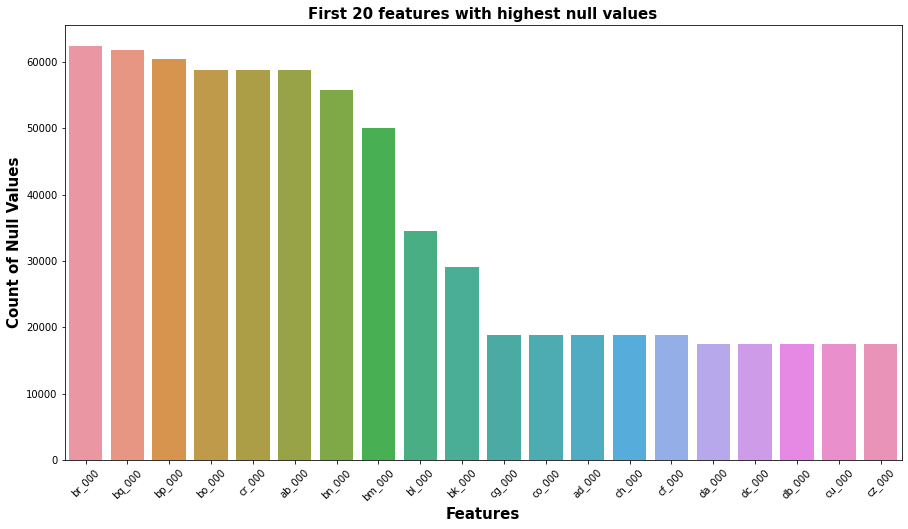

In [ ]:
### first 20 features with highest null values
plt.figure(figsize=(15,8))
sns.barplot(y=dataset.isnull().sum().sort_values(ascending=False)[:20], x=dataset.isnull().sum().sort_values(ascending=False).index[:20])
plt.ylabel('Count of Null Values', fontsize=15, fontweight='bold')
plt.xlabel("Features",fontsize=15, fontweight='bold')
plt.xticks(rotation=45)
plt.title("First 20 features with highest null values",fontsize=15, fontweight='bold')
plt.show();

In [ ]:
### Last 20 features with highest null values
pd.DataFrame(dataset.isnull().sum().sort_values(ascending=False)[-20:]).rename(columns={0:'Null Value Count'})

,Null Value Count
an_000,811
al_000,811
bh_000,811
at_000,792
au_000,792
ai_000,792
aj_000,792
am_0,792
as_000,792
aq_000,751


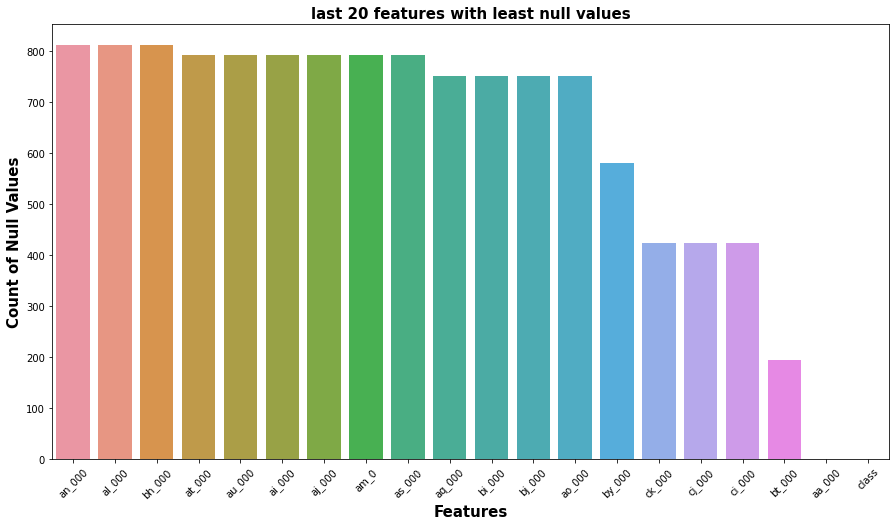

In [ ]:
### Last 20 features with highest null values
plt.figure(figsize=(15,8))
sns.barplot(y=dataset.isnull().sum().sort_values(ascending=False)[-20:], x=dataset.isnull().sum().sort_values(ascending=False).index[-20:])
plt.ylabel('Count of Null Values', fontsize=15, fontweight='bold')
plt.xlabel("Features",fontsize=15, fontweight='bold')
plt.xticks(rotation=45)
plt.title("last 20 features with least null values",fontsize=15, fontweight='bold')
plt.show();

In [12]:
### Filling null values in feature with median of that feature
for feature in [feature for feature in dataset.columns if feature not in ['class']]:
  dataset[feature]=dataset[feature].fillna(dataset[feature].median())

In [ ]:
### Checking Null values from top
pd.DataFrame(dataset.isnull().sum().sort_values(ascending=False)[:5]).rename(columns={0:'Null Value Count'})

,Null Value Count
class,0
cs_003,0
cn_009,0
co_000,0
cp_000,0


In [ ]:
### Checking Null values from bottom
pd.DataFrame(dataset.isnull().sum().sort_values(ascending=False)[-5:]).rename(columns={0:'Null Value Count'})

,Null Value Count
ba_005,0
ba_006,0
ba_007,0
ba_008,0
eg_000,0


In [ ]:
### checking duplicates in dataset
dataset.duplicated().sum()

0

In [ ]:
### Getting info about dataset
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Columns: 171 entries, class to eg_000
dtypes: int64(1), object(170)
memory usage: 99.2+ MB


### <span style='color:red '>3.2 Unique Values in Numerical features</span>

In [ ]:
### Count of unique values in numerical features
for feature in [feature for feature in dataset.columns if feature not in ['class']]:
  print("Feature {} has {} No. of unique values".format(feature,dataset[feature].nunique()))

Feature aa_000 has 25211 No. of unique values
Feature ab_000 has 31 No. of unique values
Feature ac_000 has 2230 No. of unique values
Feature ad_000 has 2028 No. of unique values
Feature ae_000 has 356 No. of unique values
Feature af_000 has 459 No. of unique values
Feature ag_000 has 199 No. of unique values
Feature ag_001 has 796 No. of unique values
Feature ag_002 has 2953 No. of unique values
Feature ag_003 has 9384 No. of unique values
Feature ag_004 has 26855 No. of unique values
Feature ag_005 has 48328 No. of unique values
Feature ag_006 has 48481 No. of unique values
Feature ag_007 has 38290 No. of unique values
Feature ag_008 has 21564 No. of unique values
Feature ag_009 has 5924 No. of unique values
Feature ah_000 has 52009 No. of unique values
Feature ai_000 has 4805 No. of unique values
Feature aj_000 has 1032 No. of unique values
Feature ak_000 has 195 No. of unique values
Feature al_000 has 10457 No. of unique values
Feature am_0 has 12215 No. of unique values
Feature an

In [ ]:
### Unique values in numerical features
for feature in [feature for feature in dataset.columns if feature not in ['class']]:
  print("Feature {} has {} unique values".format(feature,dataset[feature].unique()))

Feature aa_000 has [ 76698  33058  41040 ... 136186   7256  81852] unique values
Feature ab_000 has [0.0 '0' '2' '4' '6' '8' '18' '10' '12' '16' '204' '24' '134' '90' '26'
 '14' '34' '52' '20' '22' '30' '36' '100' '48' '58' '32' '28' '44' '46'
 '68' '38'] unique values
Feature ac_000 has ['2130706438' '0' '228' ... '5652' '3982' '3490'] unique values
Feature ad_000 has ['280' 128.0 '100' ... '7682' '1904' '2226'] unique values
Feature ae_000 has ['0' '16' '104' 0.0 '2' '222' '4' '290' '1286' '170' '6' '806' '1464'
 '274' '18' '8' '342' '64' '34' '192' '144' '176' '1512' '120' '58' '114'
 '460' '12' '112' '1314' '20' '550' '36' '1424' '180' '324' '204' '254'
 '106' '154' '92' '256' '202' '352' '26' '124' '2240' '466' '778' '28'
 '100' '14' '276' '42' '82' '22' '384' '282' '386' '98' '164' '108' '86'
 '38' '266' '1056' '134' '10' '200' '150' '326' '350' '398' '424' '32'
 '128' '752' '314' '732' '2312' '400' '158' '668' '30' '212' '224' '950'
 '4726' '60' '226' '388' '640' '258' '62' '206

In [ ]:
### Checking Datatype of features
dataset.dtypes

class     object
aa_000     int64
ab_000    object
ac_000    object
ad_000    object
           ...  
ee_007    object
ee_008    object
ee_009    object
ef_000    object
eg_000    object
Length: 171, dtype: object

### <span style='color:red '>3.3 Datatype Conversion</span>

In [13]:
### Converting datatype of numerical features to int or float from object
for feature in [feature for feature in dataset.columns if feature not in ['class', 'aa_000']]:
  try:
    dataset[feature]=dataset[feature].astype('int64')
  except:
    dataset[feature]=dataset[feature].astype('float64')

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Columns: 171 entries, class to eg_000
dtypes: float64(5), int64(165), object(1)
memory usage: 99.2+ MB


In [ ]:
### statistical analysis
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
aa_000,76000.0,6.115976e+04,2.647366e+05,0.0,860.0,30813.0,48840.0,4.294967e+07
ab_000,76000.0,1.652368e-01,1.609493e+00,0.0,0.0,0.0,0.0,2.040000e+02
ac_000,76000.0,3.364557e+08,7.769769e+08,0.0,20.0,154.0,848.0,2.130707e+09
ad_000,76000.0,1.133174e+05,3.113852e+07,0.0,42.0,128.0,292.0,8.584298e+09
ae_000,76000.0,6.454184e+00,1.501976e+02,0.0,0.0,0.0,0.0,2.105000e+04
...,...,...,...,...,...,...,...,...
ee_007,76000.0,3.440830e+05,1.698180e+06,0.0,122.0,41260.0,166632.0,1.195801e+08
ee_008,76000.0,1.383521e+05,4.667835e+05,0.0,0.0,3862.0,136421.5,1.926740e+07
ee_009,76000.0,8.329316e+03,4.848501e+04,0.0,0.0,0.0,1908.0,4.570398e+06
ef_000,76000.0,8.128947e-02,4.082657e+00,0.0,0.0,0.0,0.0,4.820000e+02


### <span style='color:red '>3.4 Numerical Features</span>

In [14]:
### Getting list of Numerical features
numerical_features=[feature for feature in dataset.columns if dataset[feature].dtypes!='O']
print(len(numerical_features))

170


In [15]:
### Getting list of Discrete Numerical features

discreate_features=[feature for feature in numerical_features if dataset[feature].nunique()<35]
print(discreate_features)

['ab_000', 'as_000', 'cd_000', 'ch_000', 'ef_000']


In [16]:
### Getting list of Continuous Numerical features

continuous_features=[feature for feature in numerical_features if feature not in discreate_features]
print(len(continuous_features))

165


### <span style='color:red '>3.5 Distribution of Continuous Features</span>

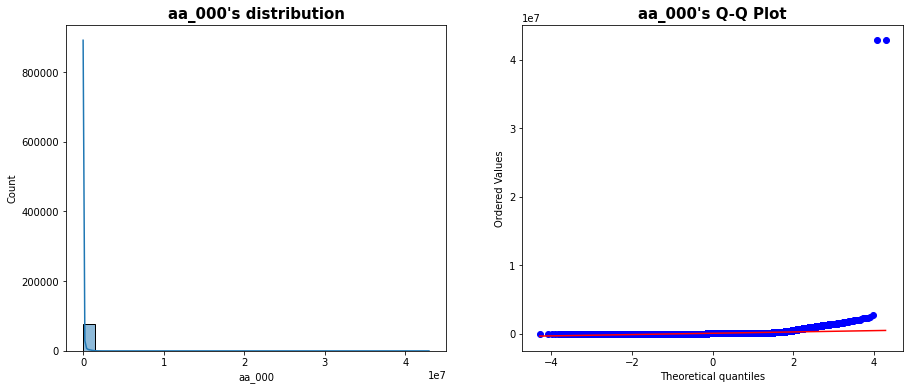

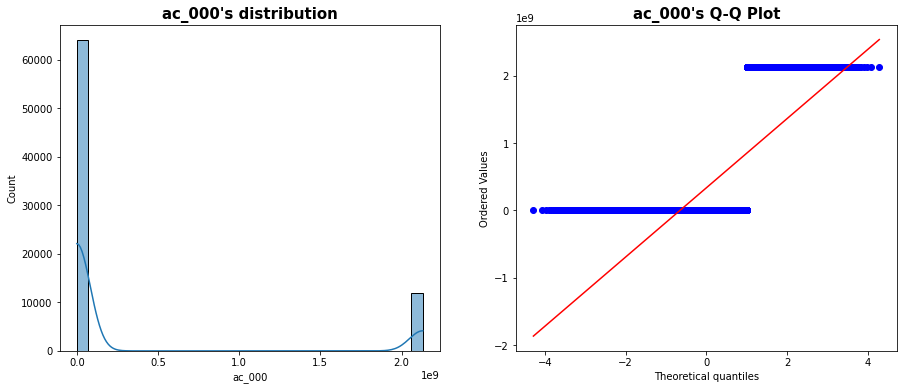

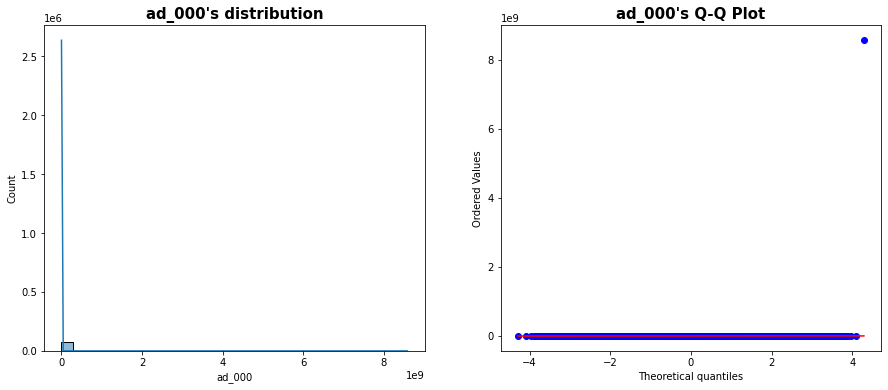

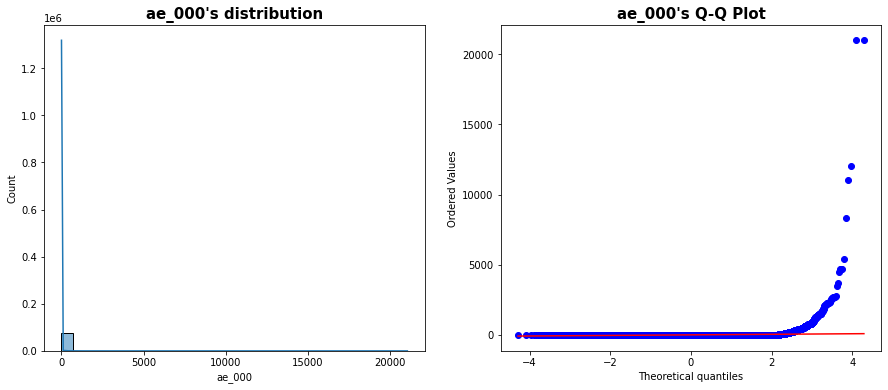

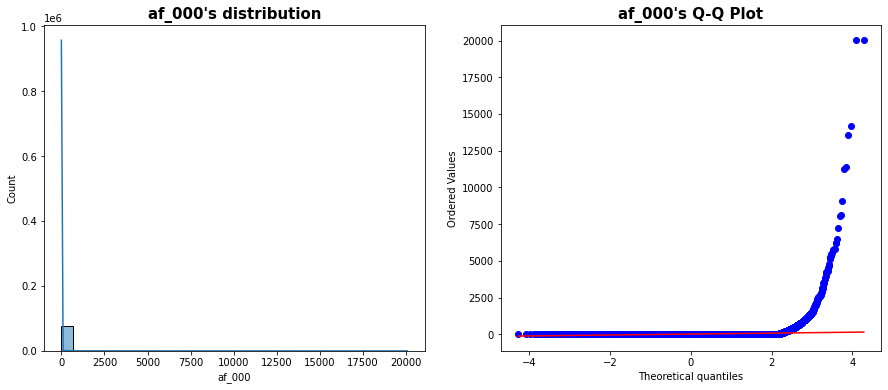

...

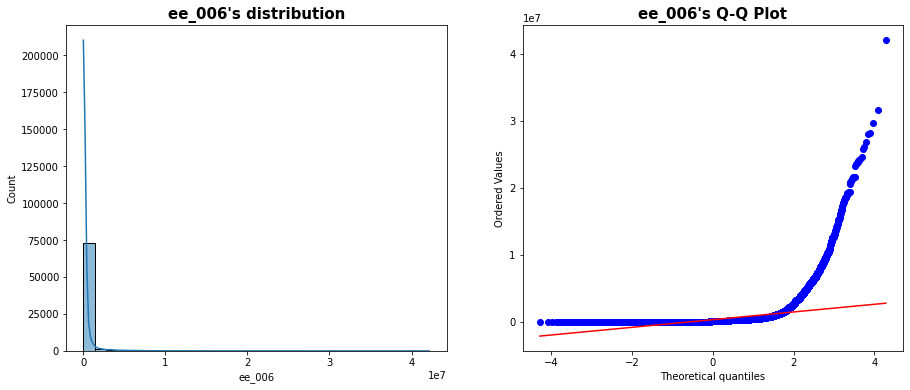

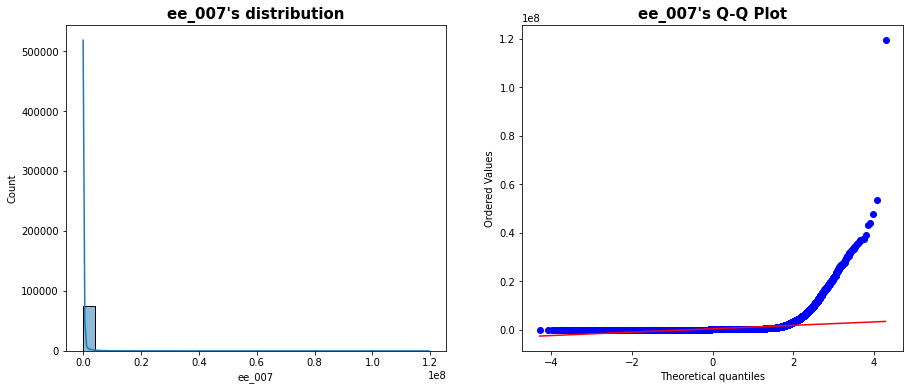

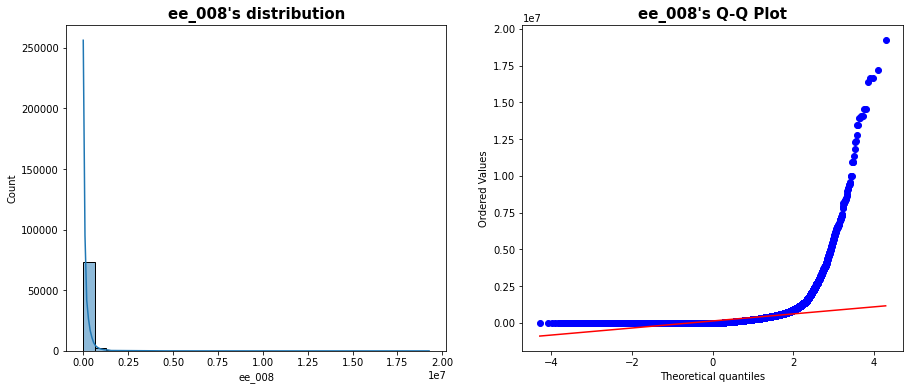

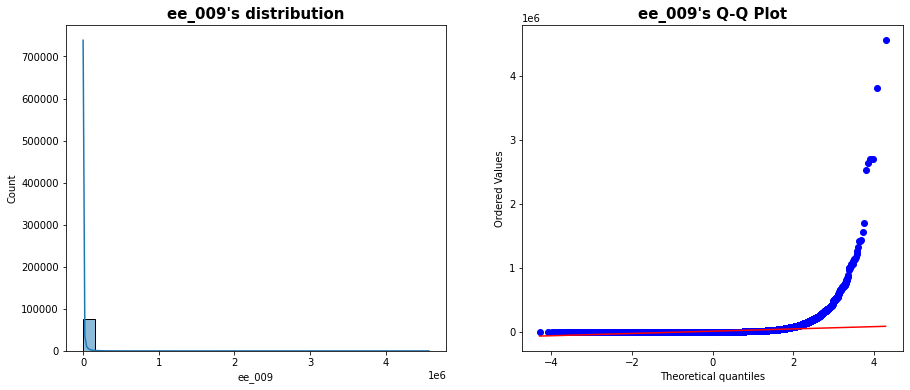

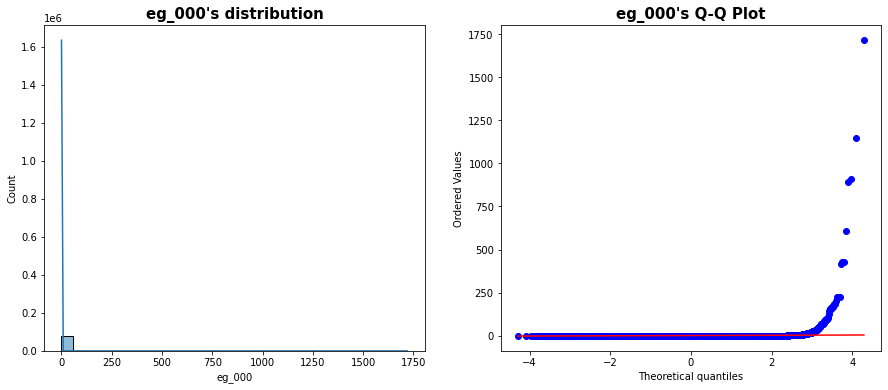

In [ ]:
### Checking distribution of Continuous numerical features

for feature in continuous_features:
    plt.figure(figsize=(15,6))
    plt.subplot(121)
    sns.histplot(data=dataset, x=feature, kde=True, bins=30)
    plt.title("{}'s distribution".format(feature),fontweight="bold", fontsize=15)
    
    plt.subplot(122)
    stats.probplot(dataset[feature], dist='norm', plot=plt)
    plt.title("{}'s Q-Q Plot".format(feature),fontweight="bold", fontsize=15)
    plt.show();

### <span style='color:red '>3.6 Outliers in Numerical Features</span>

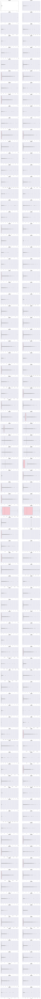

In [ ]:
### Checking outliers in numerical features

plt.figure(figsize=(20,510))
for feature in enumerate(numerical_features):
    plt.subplot(85, 2, feature[0]+1)
    sns.set(rc={'figure.figsize':(10,6)})
    sns.boxplot(data=dataset, x=feature[1], color='pink')
    plt.title("{}".format(feature[1]), fontweight="bold", fontsize=15)

### <span style='color:red '>3.7 Handling Outliers in Continuous Features</span>

In [17]:
### Function to Cap Outlier
def remove_outliers(in_data, in_col):
    # Finding the IQR
    first_quartile = in_data[in_col].quantile(0.25)
    third_quartile = in_data[in_col].quantile(0.75)
    iqr = third_quartile - first_quartile
    upper_limit = third_quartile + 1.5 * iqr
    lower_limit = first_quartile - 1.5 * iqr
    in_data.loc[(in_data[in_col]>upper_limit), in_col]= upper_limit
    in_data.loc[(in_data[in_col]<lower_limit), in_col]= lower_limit    
    return in_data

In [18]:
### Capping outliers from continuous features
for feature in continuous_features:
    dataset=remove_outliers(dataset, feature)

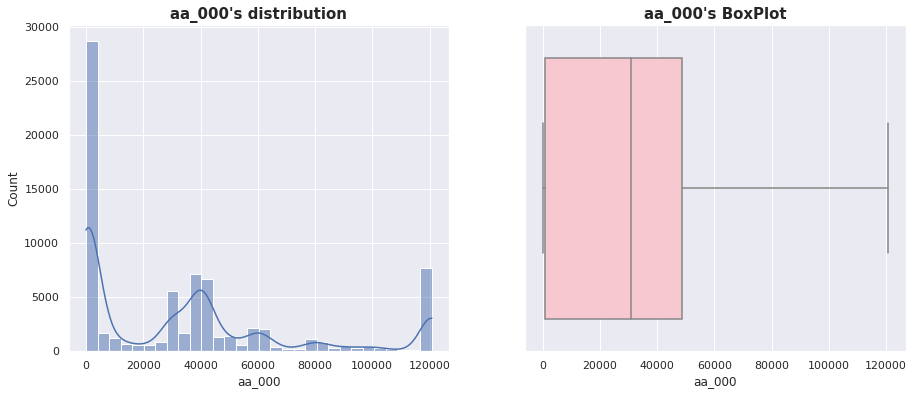

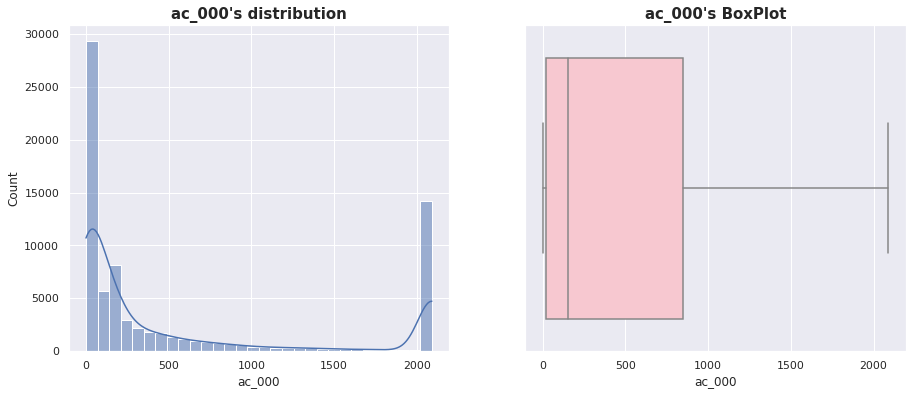

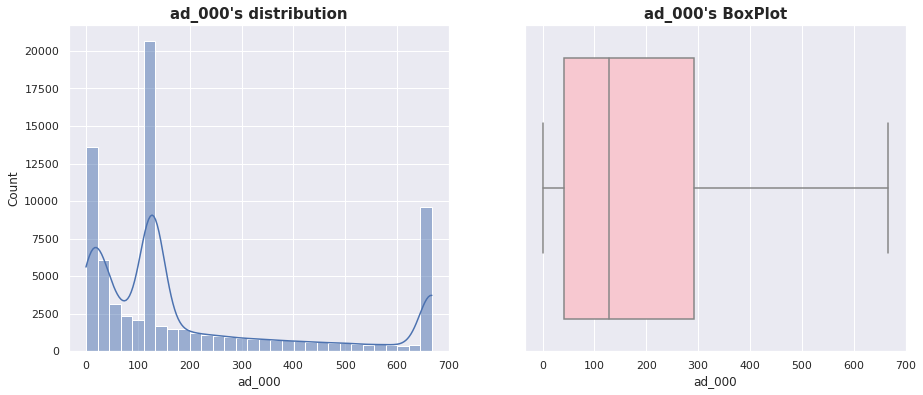

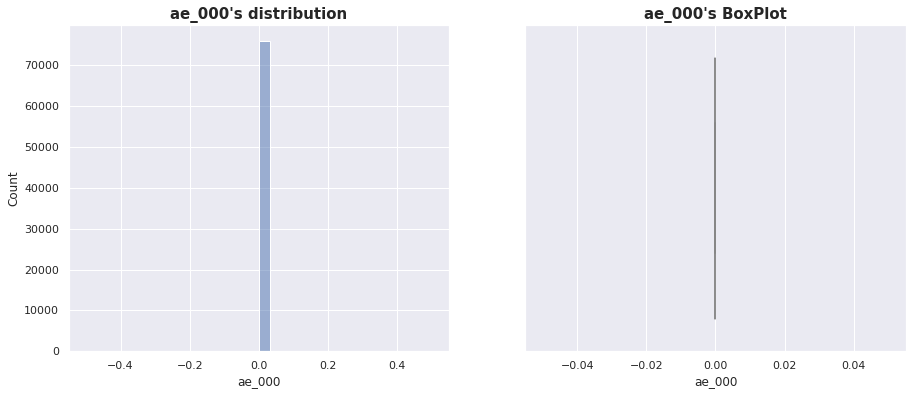

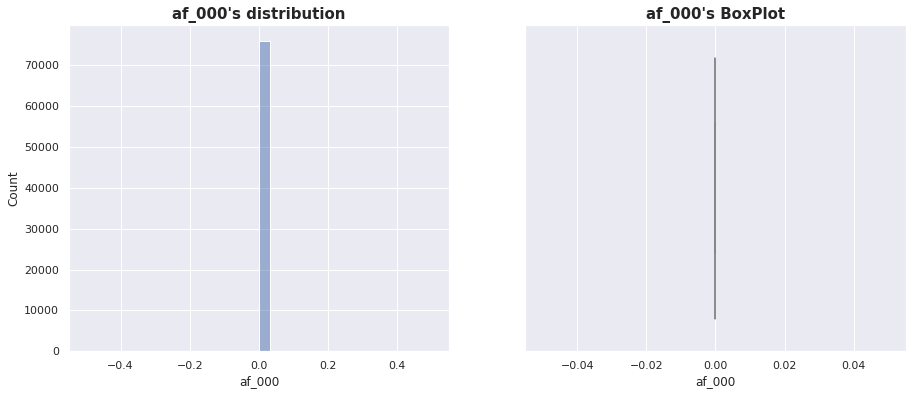

...

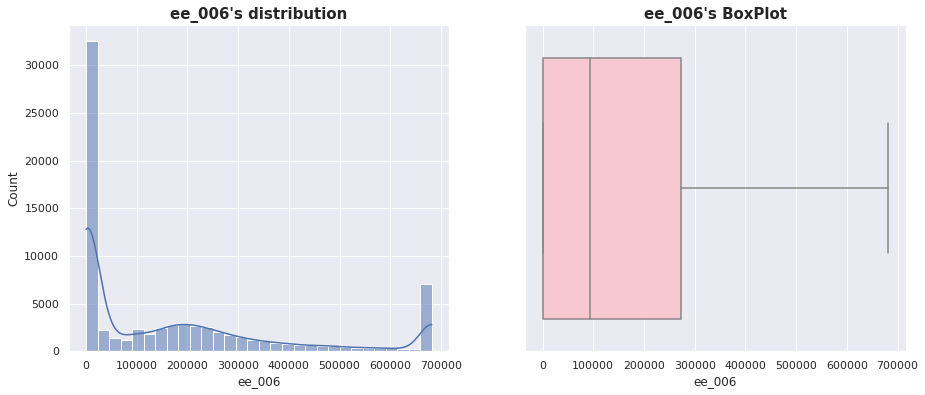

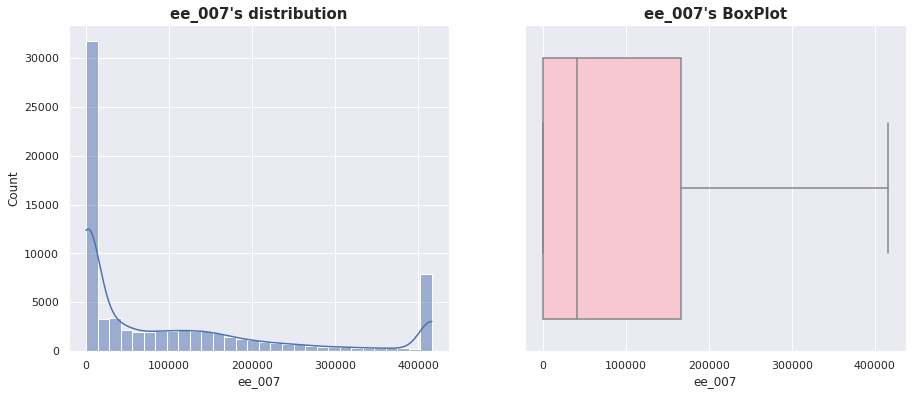

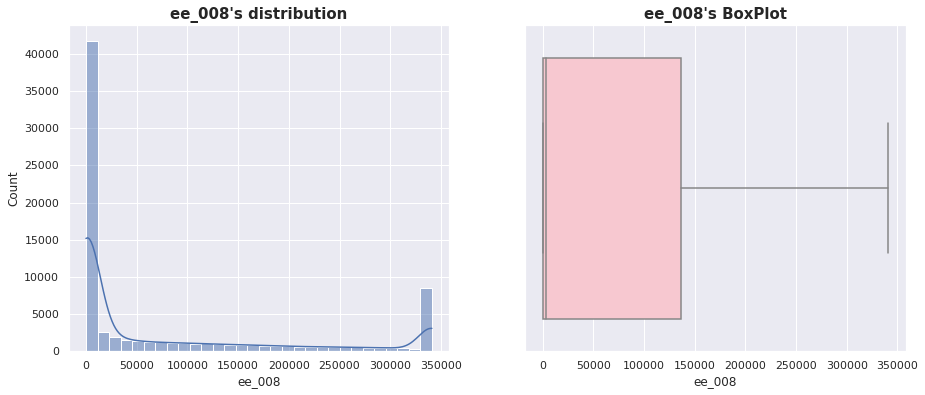

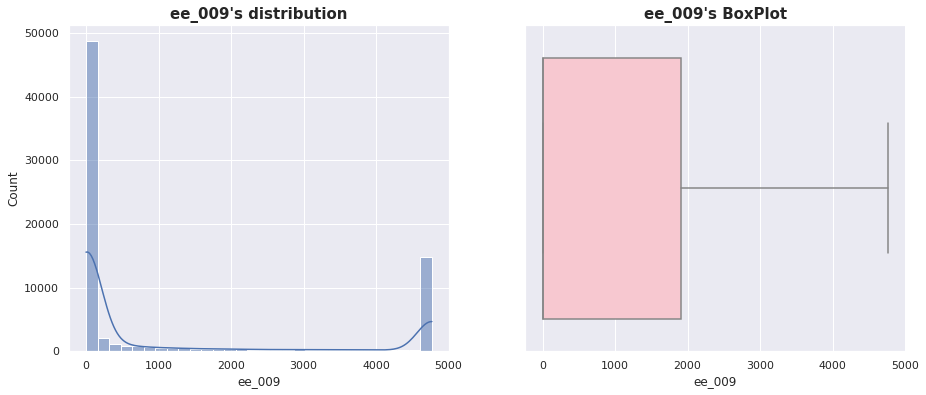

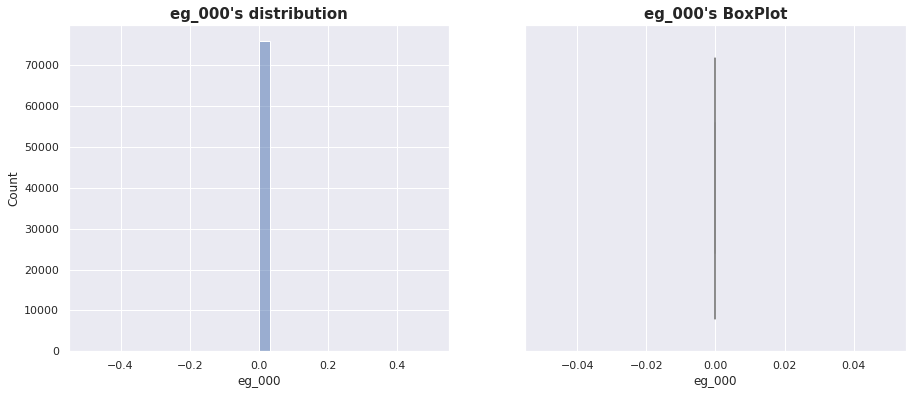

In [ ]:
### Checking distribution and Boxplot of continuous features after outlier capping

for feature in continuous_features:
    plt.figure(figsize=(15,6))
    plt.subplot(121)
    sns.histplot(data=dataset, x=feature, kde=True, bins=30)
    plt.title("{}'s distribution".format(feature),fontweight="bold", fontsize=15)
    
    plt.subplot(122)
    sns.boxplot(data=dataset, x=feature, color='pink')
    plt.title("{}'s BoxPlot".format(feature),fontweight="bold", fontsize=15)
    plt.show();

### <span style='color:red '>3.8 Numerical Features vs Target Feature</span>

In [ ]:
### Checking distribution of Numerical features with respect to target feature class
plt.figure(figsize=(20,850))
for feature in enumerate(numerical_features):
    plt.subplot(85, 2, feature[0]+1)
    sns.set(rc={'figure.figsize':(8,10)})
    sns.stripplot(data=dataset, y=feature[1], x='class')
    plt.title("{} Vs class".format(feature[1]), fontsize=15, fontweight='bold')

### <span style='color:red '>3.9 Correlation and Heatmap</span>

In [ ]:
### Getting correlation between independent features
corr=round(dataset.corr(),2)
corr

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
aa_000,1.00,-0.02,0.20,0.41,NaN,NaN,NaN,NaN,NaN,NaN,0.51,0.79,0.84,0.67,0.54,0.37,0.96,NaN,NaN,NaN,0.24,0.23,0.96,0.96,0.89,0.89,NaN,0.02,NaN,NaN,0.40,0.41,NaN,NaN,NaN,NaN,NaN,0.43,0.60,0.79,0.63,NaN,0.70,0.65,0.66,0.49,0.67,0.78,0.12,NaN,NaN,NaN,0.86,0.91,0.92,0.92,0.91,0.86,0.80,0.64,0.47,0.17,0.95,0.43,0.43,0.52,0.43,0.96,0.92,0.88,0.86,0.03,-0.05,NaN,NaN,NaN,NaN,NaN,NaN,0.40,1.00,0.95,0.95,0.88,0.93,0.39,0.39,0.45,0.88,NaN,0.57,0.09,0.53,0.00,0.98,NaN,0.86,NaN,0.12,NaN,NaN,0.30,0.67,0.88,0.83,0.67,0.70,0.72,0.55,0.33,0.33,0.95,NaN,0.79,0.85,0.73,0.78,0.80,0.91,0.72,0.61,0.20,NaN,0.42,0.43,0.71,0.44,NaN,0.35,NaN,0.06,0.75,0.75,0.53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.90,0.72,0.71,NaN,NaN,0.80,0.79,0.45,0.49,0.01,0.02,NaN,NaN,0.47,0.66,0.70,0.80,0.84,0.88,0.88,0.86,0.85,0.83,0.76,0.54,0.37,-0.00,NaN
ab_000,-0.02,1.00,0.00,-0.04,NaN,NaN,NaN,NaN,NaN,NaN,0.05,0.00,-0.04,-0.05,-0.03,-0.02,-0.01,NaN,NaN,NaN,0.10,0.10,-0.01,-0.01,-0.00,-0.01,NaN,-0.00,NaN,NaN,-0.01,0.00,NaN,NaN,NaN,NaN,NaN,-0.06,-0.07,-0.02,0.01,NaN,0.02,0.00,-0.00,-0.04,-0.06,-0.01,0.13,NaN,NaN,NaN,-0.01,-0.02,-0.02,-0.03,-0.03,-0.03,-0.04,-0.03,0.03,0.12,-0.01,0.01,-0.01,-0.00,-0.04,-0.01,-0.01,0.00,-0.00,0.02,0.01,NaN,NaN,NaN,NaN,NaN,NaN,0.01,-0.02,-0.01,-0.01,-0.01,-0.02,-0.04,-0.02,-0.02,-0.01,NaN,-0.02,0.01,-0.02,0.00,-0.01,NaN,0.00,NaN,0.12,NaN,NaN,0.09,0.01,-0.02,-0.03,-0.01,0.00,0.00,0.00,-0.02,0.01,-0.01,NaN,0.01,-0.01,0.00,-0.01,-0.01,-0.02,-0.03,-0.02,-0.02,NaN,-0.04,-0.03,-0.02,-0.01,NaN,-0.03,NaN,-0.06,-0.02,-0.00,0.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.01,-0.04,-0.04,NaN,NaN,-0.02,-0.01,-0.03,-0.03,0.05,0.05,NaN,NaN,-0.01,-0.01,0.01,-0.00,-0.02,-0.03,-0.03,-0.03,-0.03,-0.02,-0.02,-0.06,-0.06,0.05,NaN
ac_000,0.20,0.00,1.00,0.50,NaN,NaN,NaN,NaN,NaN,NaN,0.05,0.16,0.21,0.23,0.26,0.22,0.21,NaN,NaN,NaN,-0.06,-0.06,0.22,0.21,0.22,0.26,NaN,-0.00,NaN,NaN,0.48,0.47,NaN,NaN,NaN,NaN,NaN,0.12,0.18,0.18,0.15,NaN,0.06,0.08,0.09,0.12,0.09,0.24,0.06,NaN,NaN,NaN,0.20,0.24,0.21,0.21,0.21,0.18,0.19,0.17,0.06,-0.02,0.22,0.17,0.20,0.20,0.14,0.21,0.22,0.20,0.23,-0.01,-0.05,NaN,NaN,NaN,NaN,NaN,NaN,0.14,0.20,0.22,0.22,0.26,0.22,0.03,0.20,0.17,0.26,NaN,0.46,0.21,0.29,-0.00,0.22,NaN,0.23,NaN,0.29,NaN,NaN,-0.03,0.08,0.16,0.23,0.27,0.26,0.25,0.26,0.28,0.29,0.22,NaN,0.20,0.21,0.18,0.24,0.16,0.21,0.24,0.24,0.23,NaN,0.48,0.38,0.32,0.25,NaN,0.28,NaN,0.30,0.31,0.30,0.30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.25,0.26,0.38,NaN,NaN,0.25,0.28,0.39,0.35,0.15,0.14,NaN,NaN,0.17,0.23,0.28,0.23,0.24,0.22,0.20,0.18,0.16,0.16,0.16,0.16,0.14,0.02,NaN
ad_000,0.41,-0.04,0.50,1.00,NaN,NaN,NaN,NaN,NaN,NaN,0.14,0.31,0.43,0.44,0.48,0.44,0.43,NaN,NaN,NaN,-0.05,-0.06,0.43,0.41,0.42,0.47,NaN,-0.00,NaN,NaN,0.77,0.70,NaN,NaN,NaN,NaN,NaN,0.31,0.40,0.39,0.27,NaN,0.28,0.27,0.28,0.45,0.40,0.31,-0.01,NaN,NaN,NaN,0.42,0.44,0.41,0.41,0.41,0.38,0.39,0.38,

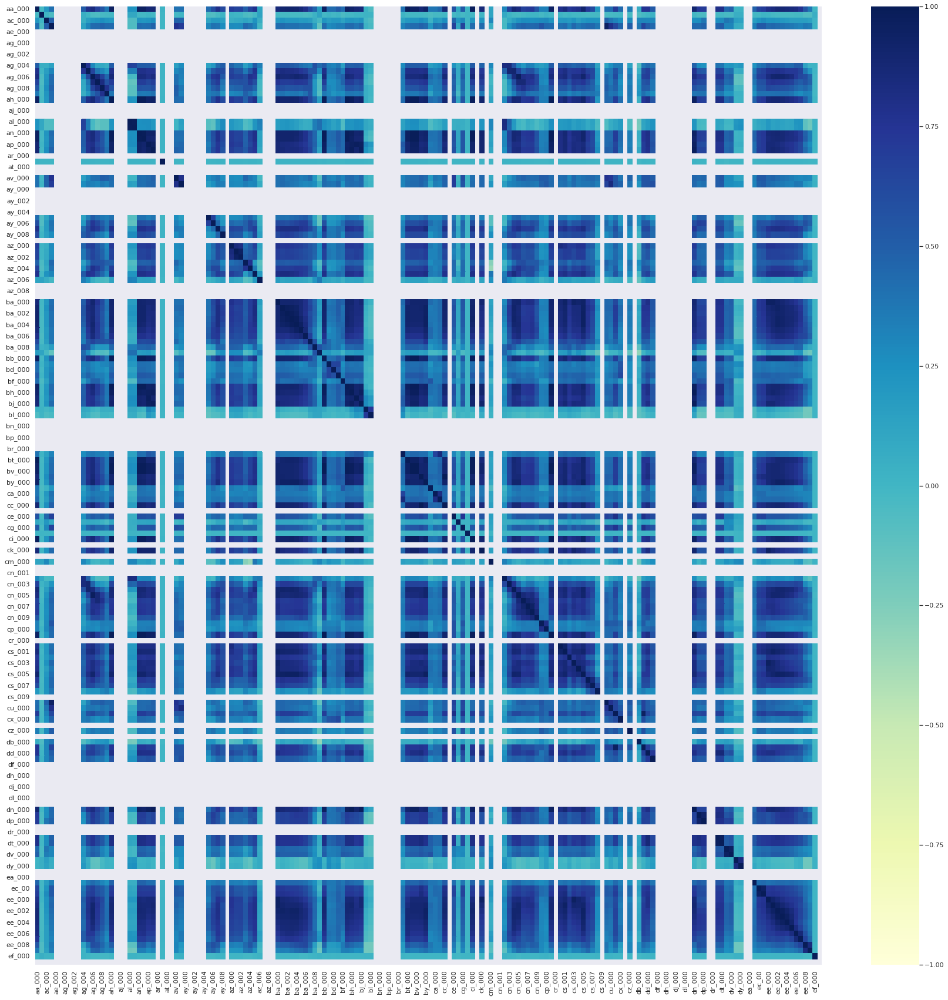

In [ ]:
### Plotting heatmap for visualising the correlation between features
sns.set(rc={'figure.figsize':(30,30)})
sns.heatmap(data=corr, annot=False,  vmin=-1, vmax=1, cmap="YlGnBu")

## <span style='color:red '>4.0 Model and Principal Component Analysis</span>

In [19]:
### Creating copy of dataset
data=dataset.copy()
data.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,0,2090,280,0,0,0,0,0,0,37250.0,1432864,3664156,1007684,25896.0,0,2551696.0,0,0,0,0.0,0,4933296.0,3655166,1761143.75,928936.75,0,0,0,0,1012,268,0,0,0,0,0,97260,3138513.75,703300.0,755876.0,0,5374.0,2108,4114,12348,615248.0,4356941.75,2378,0,0,0,2328746.0,1022304.0,415432.0,287230.0,310246.0,457187,508609,3574,0.00,0,6700214.0,0,10,108,45,2551696,97518.0,918110,799478.0,293040,261180,239120,251400,270300,287520,303960,318120,178540,76698.08,6700214.0,6700214.0,6599892.0,43566.0,30116,54064.0,638360,6167850,1209600,211863,2,96,0,5245752.00,0.0,916567.68,0,135,0,0,0.0,118196.0,1309472.0,3247182.0,1108441.75,76591.75,11208,720,77,171,6700214.0,0,10476.0,1226,233495,521832.0,428776,4015854.0,895240,26330,118,0,532,734,4122704.0,51288,0,5933,0,18,5330690.0,4732,610,0,0,0,0,0,0,0,0,62282.0,85908,20108,0,0,202710,37928.0,7798522.5,1227022,0,0,0,0,2801180.00,2445.80,2712,965866.0,1636220.25,1083002,493384,721044.0,469792,339156.0,157956,73224.00,0,0,0
1,neg,33058,0,0,128,0,0,0,0,0,0,18254.0,653294,1720800,516724,31642.0,0,1393352.0,0,0,0,0.0,0,2560898.0,2127150,1084598.00,338544.00,0,0,0,0,0,0,0,0,0,0,0,71510,772720.00,1996924.0,99560.0,0,7336.0,4902,7604,13086,1010074.0,1873902.00,10370,0,0,0,1378576.0,447166.0,199512.0,154298.0,137280.0,138668,165908,229652,4306.25,140,3646660.0,86,454,364,45,1393352,49028.0,688314,392208.0,293040,261180,239120,251400,270300,287520,303960,318120,6700,33057.51,3646660.0,3646660.0,3582034.0,17733.0,30116,115626.0,6900,2942850,1209600,0,2,46,0,2291079.36,0.0,643536.96,0,0,0,0,38.0,98644.0,1179502.0,1286736.0,336388.00,36294.00,5192,56,8,0,3646660.0,0,6160.0,796,164860,350066.0,272956,1837600.0,301242,9148,22,0,212,280,1186436.0,44669,0,204,0,0,1743089.0,3312,522,0,0,0,0,0,0,0,0,33736.0,36946,5936,0,0,103330,16254.0,4510080.0,868538,0,0,0,0,3477820.00,2211.76,2334,664504.0,824154.00,421400,178064,293306.0,245416,133654.0,81140,97576.00,1500,0,0
2,neg,41040,0,228,100,0,0,0,0,0,0,1648.0,370592,1883374,292936,12016.0,0,1234132.0,0,0,0,0.0,0,2371990.0,2173634,300796.00,153698.00,0,0,0,0,358,110,0,0,0,0,0,0,870456.00,239798.0,1450312.0,0,1620.0,1156,1228,34250,1811606.0,710672.00,34,0,0,0,790690.0,672026.0,332340.0,254892.0,189596.0,135758,103552,81666,46.00,0,2673338.0,128,202,576,4,1234132,28804.0,160176,139730.0,137160,185340,239120,251400,270300,287520,303960,318120,28000,41040.08,2673338.0,2673338.0,2678534.0,15439.0,7466,22436.0,248240,2560566,1209600,63328,0,124,0,2322692.16,0.0,236099.52,0,0,0,0,0.0,33276.0,1215280.0,1102798.0,196502.00,10260.00,2422,28,0,6,2673338.0,0,3584.0,500,56362,149726.0,100326,1744838.0,488302,16682,246,0,230,292,2180528.0,29188,0,5933,0,0,2341048.0,1494,152,0,0,0,0,0,0,0,0,13876.0,38182,8138,0,0,65772,10534.0,300240.0,48028,0,0,0,0,1040120.00,1018.64,1020,262032.0,453378.00,277378,159812,423992

### <span style='color:red '>4.1 Scaling Dataset for PCA</span>

In [20]:
### Creating standard scaler object for scaling data, that will be passed to PCA object for dimensionality reduction
scaler=StandardScaler()
scaler

StandardScaler()

In [21]:
### Getting independent features in a dataframe
X=data.drop('class', axis=1)
X.head()

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698,0,2090,280,0,0,0,0,0,0,37250.0,1432864,3664156,1007684,25896.0,0,2551696.0,0,0,0,0.0,0,4933296.0,3655166,1761143.75,928936.75,0,0,0,0,1012,268,0,0,0,0,0,97260,3138513.75,703300.0,755876.0,0,5374.0,2108,4114,12348,615248.0,4356941.75,2378,0,0,0,2328746.0,1022304.0,415432.0,287230.0,310246.0,457187,508609,3574,0.00,0,6700214.0,0,10,108,45,2551696,97518.0,918110,799478.0,293040,261180,239120,251400,270300,287520,303960,318120,178540,76698.08,6700214.0,6700214.0,6599892.0,43566.0,30116,54064.0,638360,6167850,1209600,211863,2,96,0,5245752.00,0.0,916567.68,0,135,0,0,0.0,118196.0,1309472.0,3247182.0,1108441.75,76591.75,11208,720,77,171,6700214.0,0,10476.0,1226,233495,521832.0,428776,4015854.0,895240,26330,118,0,532,734,4122704.0,51288,0,5933,0,18,5330690.0,4732,610,0,0,0,0,0,0,0,0,62282.0,85908,20108,0,0,202710,37928.0,7798522.5,1227022,0,0,0,0,2801180.00,2445.80,2712,965866.0,1636220.25,1083002,493384,721044.0,469792,339156.0,157956,73224.00,0,0,0
1,33058,0,0,128,0,0,0,0,0,0,18254.0,653294,1720800,516724,31642.0,0,1393352.0,0,0,0,0.0,0,2560898.0,2127150,1084598.00,338544.00,0,0,0,0,0,0,0,0,0,0,0,71510,772720.00,1996924.0,99560.0,0,7336.0,4902,7604,13086,1010074.0,1873902.00,10370,0,0,0,1378576.0,447166.0,199512.0,154298.0,137280.0,138668,165908,229652,4306.25,140,3646660.0,86,454,364,45,1393352,49028.0,688314,392208.0,293040,261180,239120,251400,270300,287520,303960,318120,6700,33057.51,3646660.0,3646660.0,3582034.0,17733.0,30116,115626.0,6900,2942850,1209600,0,2,46,0,2291079.36,0.0,643536.96,0,0,0,0,38.0,98644.0,1179502.0,1286736.0,336388.00,36294.00,5192,56,8,0,3646660.0,0,6160.0,796,164860,350066.0,272956,1837600.0,301242,9148,22,0,212,280,1186436.0,44669,0,204,0,0,1743089.0,3312,522,0,0,0,0,0,0,0,0,33736.0,36946,5936,0,0,103330,16254.0,4510080.0,868538,0,0,0,0,3477820.00,2211.76,2334,664504.0,824154.00,421400,178064,293306.0,245416,133654.0,81140,97576.00,1500,0,0
2,41040,0,228,100,0,0,0,0,0,0,1648.0,370592,1883374,292936,12016.0,0,1234132.0,0,0,0,0.0,0,2371990.0,2173634,300796.00,153698.00,0,0,0,0,358,110,0,0,0,0,0,0,870456.00,239798.0,1450312.0,0,1620.0,1156,1228,34250,1811606.0,710672.00,34,0,0,0,790690.0,672026.0,332340.0,254892.0,189596.0,135758,103552,81666,46.00,0,2673338.0,128,202,576,4,1234132,28804.0,160176,139730.0,137160,185340,239120,251400,270300,287520,303960,318120,28000,41040.08,2673338.0,2673338.0,2678534.0,15439.0,7466,22436.0,248240,2560566,1209600,63328,0,124,0,2322692.16,0.0,236099.52,0,0,0,0,0.0,33276.0,1215280.0,1102798.0,196502.00,10260.00,2422,28,0,6,2673338.0,0,3584.0,500,56362,149726.0,100326,1744838.0,488302,16682,246,0,230,292,2180528.0,29188,0,5933,0,0,2341048.0,1494,152,0,0,0,0,0,0,0,0,13876.0,38182,8138,0,0,65772,10534.0,300240.0,48028,0,0,0,0,1040120.00,1018.64,1020,262032.0,453378.00,277378,159812,423992.0,409564,320746.0

In [22]:
### seperating target feature
y=data['class']
y.unique()

array(['neg', 'pos'], dtype=object)

In [23]:
### encoding target feature
y=y.replace({'neg':0, 'pos':1})

In [24]:
y.unique()

array([0, 1])

In [25]:
### Scaling data for PCA
X_scaled=scaler.fit_transform(X)   
X_scaled 

array([[ 1.07837285, -0.10266458,  1.89955009, ..., -0.61980671,
        -0.01991106,  0.        ],
       [-0.05883293, -0.10266458, -0.73527828, ...,  0.16213595,
        -0.01991106,  0.        ],
       [ 0.14916837, -0.10266458, -0.44784246, ..., -0.35186103,
        -0.01991106,  0.        ],
       ...,
       [ 1.15493359, -0.10266458,  1.37006305, ...,  1.86677095,
        -0.01991106,  0.        ],
       [-0.91741808, -0.10266458, -0.68989368, ..., -0.61980671,
        -0.01991106,  0.        ],
       [-0.92007608, -0.10266458, -0.72771418, ..., -0.61980671,
        -0.01991106,  0.        ]])

### <span style='color:red '>4.2 Function for Model Training, Evaluation and feature reduction using PCA</span>

In [50]:
### Creating function that will evaluate model
def model_evaluator(actual_val, pred_val):
    """
    The function takes actual value and predicted value as argument 
    and returns Accuracy, Precision, Recall, F-1 Score rounded to 
    3 decimal places.
    """
    acc=round(accuracy_score(actual_val, pred_val),5)
    prec=round(precision_score(actual_val, pred_val),5)
    rec=round(recall_score(actual_val, pred_val),5) 
    roc_auc=round(roc_auc_score(actual_val, pred_val),5)
    return acc, prec, rec, roc_auc

### creating dictionary containing model objects for different algorithmn
models={
    "Logistic Regression":LogisticRegression(),
    "Support Vector Classifier":SVC(),
    "Decision Tree Classifier":DecisionTreeClassifier(),
    "Random Forest Classifier":RandomForestClassifier(),
    "Bagging Classifier": BaggingClassifier(base_estimator=LogisticRegression()),
    "Extra Tree Classifier": ExtraTreesClassifier(),
    "AdaBoost Classifier": AdaBoostClassifier(),
    "GradientBoost Classifier": GradientBoostingClassifier(),
    "XGBoost Classifier": XGBClassifier()
}



### Creating function for model training
def model_trainer(model, X_train_data, y_train_data, X_test_data):
    """
    This function takes model object, X train data, y train data, and 
    X test data as argument, trains model and gives prediction for train data 
    and prediction for test data.
    """
    model.fit(X_train_data, y_train_data)
    y_train_pred=model.predict(X_train_data)
    pred_val=model.predict(X_test_data)
    return y_train_pred, pred_val


def pca_dataframe(scaled_data, features_req):
    """
    This function takes scaled dataframe and No. of features to be reduced as an 
    argument and returns the datafeame with reduced features equal to No. of features
    argument.
    """
    pca=PCA(n_components=features_req,copy=True )
    pca.fit(scaled_data)
    X=pca.transform(scaled_data)
    X=pd.DataFrame(X)
    return X

### <span style='color:red '>4.3 Fifty Feature Dataset, Model training and evaluation</span>

In [56]:
### Reducing 170 features to 50 Principal Components(features) using PCA 
X_50=pca_dataframe(X_scaled, 50)
X_50.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49
0,13.155232,-2.487131,-0.639465,1.350081,-2.817921,2.866244,-2.381754,3.709635,-1.015128,-0.542901,-0.794362,0.377320,2.359608,0.659629,2.195921,-1.408785,0.680171,0.196774,-1.139539,-1.656853,-0.019189,-0.989645,1.432824,-0.135688,0.574709,-0.071068,-0.246383,1.212510,0.229621,0.690930,1.415683,0.630307,0.889745,0.028319,-0.010074,0.038616,-0.839664,0.070574,0.173015,-0.101535,-0.609311,0.815011,-0.740613,-0.596241,-0.205474,0.629183,-0.704654,-0.848785,0.024437,-0.418718
1,3.454569,1.661230,-1.791722,1.451447,-3.924356,-1.517795,0.314623,0.848009,0.190367,-1.972652,-1.371577,-2.299781,1.259446,0.509130,0.418767,0.227194,0.322984,0.092008,-0.664217,0.740970,0.354672,-0.485124,-1.447313,0.004885,-1.093337,1.108730,0.302052,0.632171,-0.202214,0.725177,-1.340394,-0.701682,0.237923,-0.197790,-0.656604,0.118638,-1.178840,-0.903803,-0.351981,-0.033144,1.119116,1.347075,-0.021876,0.308273,1.017620,-0.778294,0.152747,-0.614955,1.906055,-1.358175
2,-0.151016,-1.172394,-1.339706,-1.851379,1.924689,0.441295,-0.875388,-1.498199,-0.111972,-0.769382,-1.707607,1.283205,-0.806403,-0.256216,0.044603,1.070700,0.065186,-0.016226,-0.370509,0.059645,-0.231536,0.262454,-0.289956,0.281240,-0.931829,-0.521107,0.777598,-0.913631,0.911187,1.247276,0.894543,0.804212,-0.491647,0.408737,-0.623549,-0.344838,0.059869,0.997517,0.424374,0.199410,-0.618808,0.512062,0.708787,-0.400366,-0.093736,0.269180,0.446692,0.346951,-0.384256,0.060316
3,-8.405538,1.181925,-0.195872,0.116039,-0.019529,0.959090,0.295976,-0.624490,-0.418561,-0.231956,1.417748,0.110812,-0.681375,0.743451,0.567789,0.047884,-0.152652,0.127730,0.316424,-0.682872,0.676148,-0.176248,-0.264461,0.191476,0.329781,0.259811,0.023001,-0.135936,0.434284,-0.308727,-0.021182,0.298884,-0.096554,0.381351,-0.214241,0.075403,0.507100,0.192740,0.230793,0.044068,-0.091675,0.111687,0.110259,0.035472,0.233319,-0.186815,0.066073,0.208399,-0.123750,-0.162474
4,6.726380,-1.759463,5.228396,-0.812152,0.479641,-1.743832,-2.266648,-0.927605,-2.164661,0.297108,0.503472,0.730800,3.062260,4.024420,-0.462020,-0.188538,-0.058691,0.140900,-0.015460,0.768987,-0.836334,-0.795349,-0.654719,-0.533646,2.016538,-0.651200,-1.212791,-0.446437,-0.586120,0.070828,0.783561,0.624602,0.733637,0.450585,-0.370194,0.146813,0.474534,-0.139005,1.093436,-0.343627,-0.482032,0.420589,-1.136549,0.121537,-0.492926,-0.611604,-0.377366,-0.625347,-0.082969,-0.038637


In [57]:
### train test split
X_train, X_test, y_train, y_test = train_test_split(X_50, y, test_size=0.25, random_state=19)

In [58]:
### Creating empty list to store model names
model_list=[]
### creating empty list to store accuracy score for each model
acc_score_list=[]
### creating empty list for storing precision score
prec_score_list=[]
### creating list to store recall score
recall_list=[]
### creating list to store roc_auc score
roc_auc_list=[]

### Training all models and getting their performance and storing it in empty list
for num in range(len(list(models))):
    ### selecting model
    model=list(models.values())[num]
    
    ### getting training data prediction and test data prediction
    y_pred, pred_val=model_trainer(model,X_train, y_train, X_test)
    
    ### Getting model performance parameters for training data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_train,y_pred )
    print("{} Model\n".format(list(models.keys())[num]))
    print("Model Performance for training dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    print("-"*50)
    
    ### Getting model performance parameters for test data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_test,pred_val)
    print("Model Performance for Test dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    
    ### Appending model name and Performance score in seperate list so that models can be sorted in terms of performance
    model_list.append(list(models.keys())[num])
    acc_score_list.append(acc_score)
    prec_score_list.append(prec_score)
    recall_list.append(rec_score)
    roc_auc_list.append(roc_auc)
    print("*"*50)
    print("\n")

Logistic Regression Model

Model Performance for training dataset
Accuracy score: 0.98642
Precision Score: 0.73034
Recall Score: 0.38235
Roc_Auc Score: 0.68989
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98547
Precision Score: 0.70051
Recall Score: 0.38873
Roc_Auc Score: 0.69278
**************************************************


Support Vector Classifier Model

Model Performance for training dataset
Accuracy score: 0.99107
Precision Score: 0.90491
Recall Score: 0.5598
Roc_Auc Score: 0.77937
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98937
Precision Score: 0.86256
Recall Score: 0.51268
Roc_Auc Score: 0.75556
**************************************************


Decision Tree Classifier Model

Model Performance for training dataset
Accuracy score: 1.0
Precision Score: 1.0
Recall Score: 1.0
Roc_Auc Score: 1.0
--------------------------------------------------
Model Per

In [59]:
### Tabulating model performance in dataframe
model_perf_50=pd.DataFrame(list(zip(model_list, acc_score_list,prec_score_list, recall_list, roc_auc_list)), columns=['Model', 'Accuracy', 'Precision', 'Recall', 'Roc_Auc Score']).sort_values(by=['Accuracy'], ascending=False,).reset_index()
model_perf_50.drop('index', axis=1, inplace=True)
model_perf_50

,Model,Accuracy,Precision,Recall,Roc_Auc Score
0,Support Vector Classifier,0.98937,0.86256,0.51268,0.75556
1,Random Forest Classifier,0.98858,0.95395,0.40845,0.70404
2,Extra Tree Classifier,0.98768,0.94815,0.36056,0.68009
3,GradientBoost Classifier,0.98668,0.76842,0.41127,0.70445
4,XGBoost Classifier,0.98637,0.83333,0.33803,0.66837
5,Logistic Regression,0.98547,0.70051,0.38873,0.69278
6,Bagging Classifier,0.98537,0.69543,0.38592,0.69135
7,AdaBoost Classifier,0.98389,0.59608,0.42817,0.71132
8,Decision Tree Classifier,0.98153,0.50592,0.48169,0.73637


In [60]:
### saving this dataframe to csv
from google.colab import files
model_perf_50.to_csv('model_perf_50.csv') 
files.download('model_perf_50.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

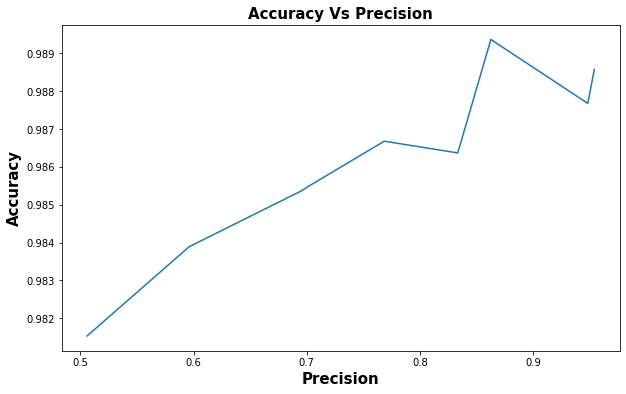

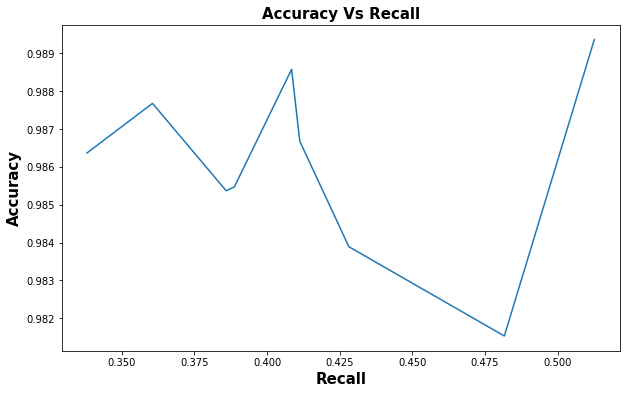

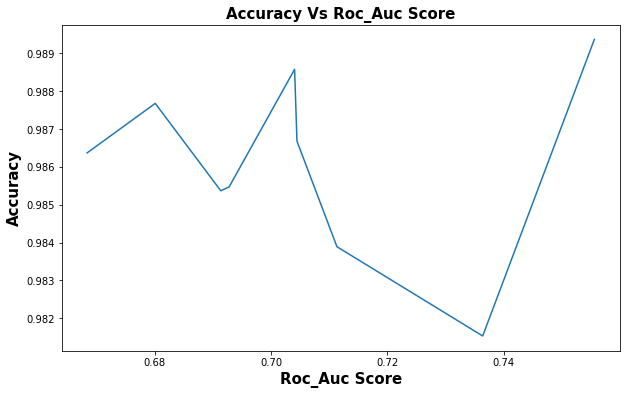

In [61]:
### Accuracy vs Precision and Recall
for feature1 in ['Accuracy']:
    for feature2 in ['Precision', 'Recall', 'Roc_Auc Score']:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_50)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

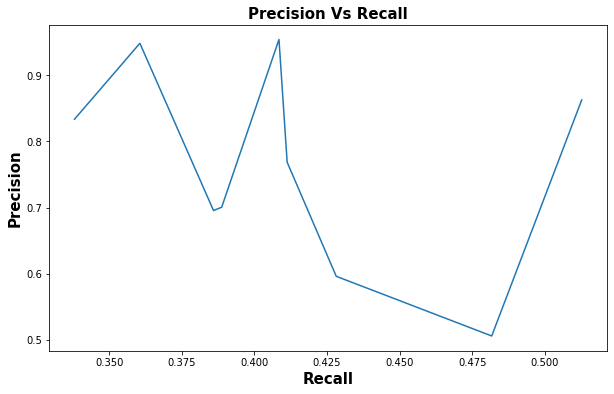

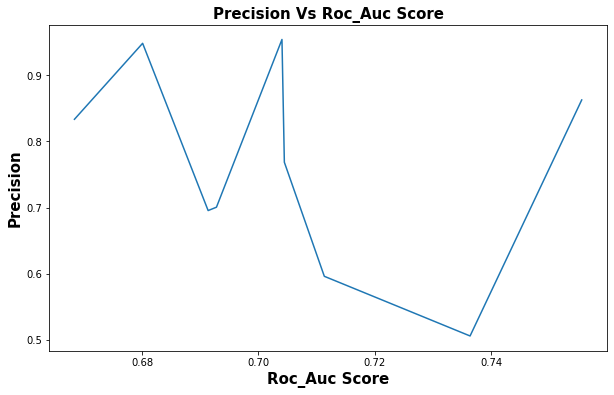

In [62]:
### Precision vs Recall and Roc_Auc Score
for feature1 in ['Precision']:
    for feature2 in [ 'Recall','Roc_Auc Score' ]:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_50)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

### <span style='color:red '>4.4 Thirty Feature Dataset, Model training and evaluation</span>

In [63]:
### Reducing 170 features to 30 Principal Components(features) using PCA 
X_30=pca_dataframe(X_scaled, 30)
X_30.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,13.155232,-2.487131,-0.639465,1.350088,-2.817939,2.866230,-2.381815,3.709724,-1.015142,-0.542749,-0.794315,0.377223,2.360405,0.660716,2.193942,-1.408253,0.684440,0.198069,-1.140442,-1.656047,-0.016136,-0.989074,1.432387,-0.132036,0.564485,-0.085051,-0.234268,1.226618,-0.262907,0.730531
1,3.454569,1.661230,-1.791722,1.451443,-3.924356,-1.517844,0.314529,0.847952,0.190097,-1.972985,-1.371671,-2.299701,1.257463,0.509972,0.419139,0.228548,0.322302,0.090738,-0.659811,0.740714,0.354423,-0.480942,-1.446762,0.000266,-1.098400,1.107544,0.304549,0.632503,0.248062,0.747405
2,-0.151016,-1.172394,-1.339706,-1.851387,1.924708,0.441193,-0.875524,-1.498286,-0.111897,-0.769466,-1.707545,1.283404,-0.806494,-0.254751,0.042835,1.071877,0.067961,-0.017927,-0.360752,0.056648,-0.229446,0.261198,-0.289745,0.278593,-0.933534,-0.550112,0.756510,-0.851049,-0.938233,1.224014
3,-8.405538,1.181925,-0.195872,0.116034,-0.019525,0.959093,0.295982,-0.624593,-0.418671,-0.232210,1.417624,0.110858,-0.681957,0.743466,0.567732,0.046666,-0.154620,0.127865,0.314855,-0.683085,0.675907,-0.175464,-0.264905,0.188015,0.331881,0.258049,0.021614,-0.125664,-0.416750,-0.319732
4,6.726380,-1.759464,5.228396,-0.812152,0.479618,-1.743745,-2.266590,-0.927699,-2.164968,0.296746,0.503269,0.730825,3.061710,4.024699,-0.462794,-0.191564,-0.059345,0.142991,-0.019551,0.768936,-0.836927,-0.792686,-0.661404,-0.537592,2.008906,-0.655546,-1.203558,-0.462438,0.607247,0.082447


In [64]:
### train test split
X_train, X_test, y_train, y_test = train_test_split(X_30, y, test_size=0.25, random_state=19)

In [65]:
### Creating empty list to store model names
model_list=[]
### creating empty list to store accuracy score for each model
acc_score_list=[]
### creating empty list for storing precision score
prec_score_list=[]
### creating list to store recall score
recall_list=[]
### creating list to store roc_auc score
roc_auc_list=[]

### Training all models and getting their performance and storing it in empty list
for num in range(len(list(models))):
    ### selecting model
    model=list(models.values())[num]
    
    ### getting training data prediction and test data prediction
    y_pred, pred_val=model_trainer(model,X_train, y_train, X_test)
    
    ### Getting model performance parameters for training data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_train,y_pred )
    print("{} Model\n".format(list(models.keys())[num]))
    print("Model Performance for training dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    print("-"*50)
    
    ### Getting model performance parameters for test data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_test,pred_val)
    print("Model Performance for Test dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    
    ### Appending model name and Performance score in seperate list so that models can be sorted in terms of performance
    model_list.append(list(models.keys())[num])
    acc_score_list.append(acc_score)
    prec_score_list.append(prec_score)
    recall_list.append(rec_score)
    roc_auc_list.append(roc_auc)
    print("*"*50)
    print("\n")

Logistic Regression Model

Model Performance for training dataset
Accuracy score: 0.98449
Precision Score: 0.74113
Recall Score: 0.2049
Roc_Auc Score: 0.6018
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98368
Precision Score: 0.71845
Recall Score: 0.20845
Roc_Auc Score: 0.60345
**************************************************


Support Vector Classifier Model

Model Performance for training dataset
Accuracy score: 0.98879
Precision Score: 0.88024
Recall Score: 0.43235
Roc_Auc Score: 0.71564
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98758
Precision Score: 0.85629
Recall Score: 0.40282
Roc_Auc Score: 0.70076
**************************************************


Decision Tree Classifier Model

Model Performance for training dataset
Accuracy score: 1.0
Precision Score: 1.0
Recall Score: 1.0
Roc_Auc Score: 1.0
--------------------------------------------------
Model Perf

In [66]:
### Tabulating model performance in dataframe
model_perf_30=pd.DataFrame(list(zip(model_list, acc_score_list,prec_score_list, recall_list, roc_auc_list)), columns=['Model', 'Accuracy', 'Precision', 'Recall', 'Roc_Auc Score']).sort_values(by=['Accuracy'], ascending=False,).reset_index()
model_perf_30.drop('index', axis=1, inplace=True)
model_perf_30

,Model,Accuracy,Precision,Recall,Roc_Auc Score
0,Random Forest Classifier,0.98889,0.91860,0.44507,0.72216
1,Extra Tree Classifier,0.98800,0.89937,0.40282,0.70098
2,Support Vector Classifier,0.98758,0.85629,0.40282,0.70076
3,GradientBoost Classifier,0.98584,0.78289,0.33521,0.66672
4,XGBoost Classifier,0.98558,0.85217,0.27606,0.63757
5,Bagging Classifier,0.98379,0.74737,0.20000,0.59936
6,Logistic Regression,0.98368,0.71845,0.20845,0.60345
7,Decision Tree Classifier,0.98316,0.55255,0.51831,0.75516
8,AdaBoost Classifier,0.98221,0.54067,0.31831,0.65658


In [67]:
### saving this dataframe to csv
from google.colab import files
model_perf_30.to_csv('model_perf_30.csv') 
files.download('model_perf_30.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

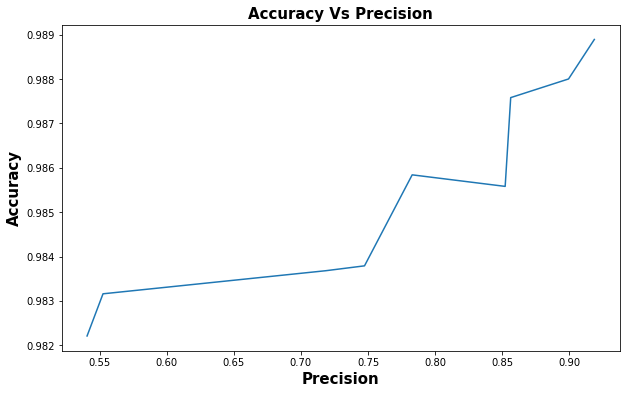

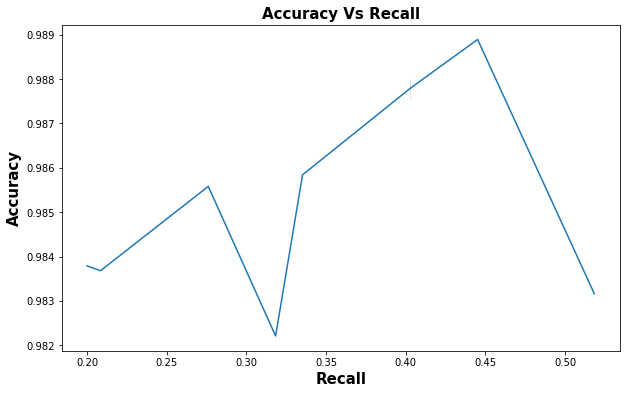

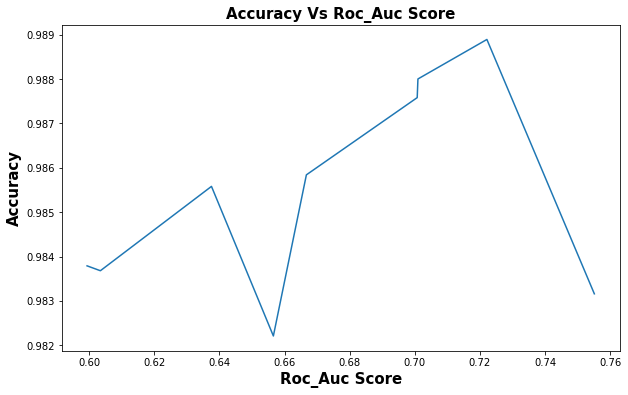

In [68]:
### Accuracy vs Precision and Recall
for feature1 in ['Accuracy']:
    for feature2 in ['Precision', 'Recall', 'Roc_Auc Score']:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_30)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

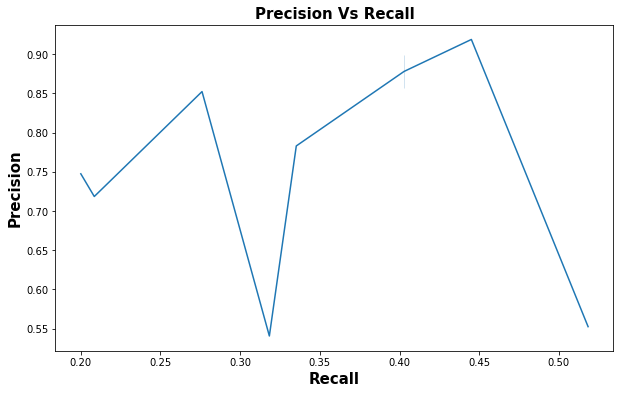

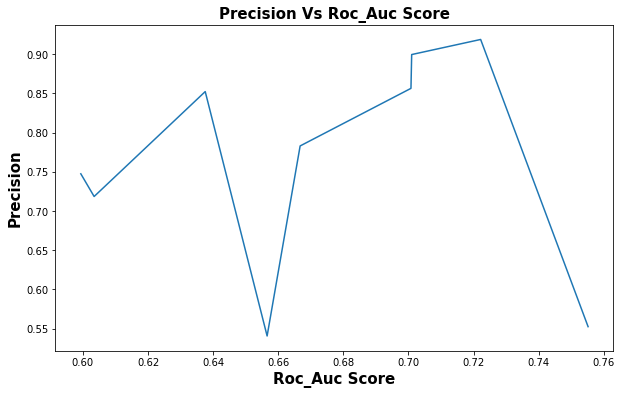

In [69]:
### Precision vs Recall and Roc_Auc Score
for feature1 in ['Precision']:
    for feature2 in [ 'Recall','Roc_Auc Score' ]:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_30)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

### <span style='color:red '>4.5 Twenty Feature Dataset, Model training and evaluation</span>

In [70]:
### Reducing 170 features to 20 Principal Components(features) using PCA 
X_20=pca_dataframe(X_scaled, 20)
X_20.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,13.155232,-2.487130,-0.639456,1.350081,-2.818012,2.866124,-2.382636,3.708586,-1.016599,-0.536630,-0.790330,0.381157,2.348034,0.661695,2.205744,-1.392439,0.675755,0.222847,-1.122289,-1.643472
1,3.454569,1.661229,-1.791720,1.451691,-3.924241,-1.514989,0.312656,0.844446,0.196842,-1.962717,-1.369440,-2.303702,1.267309,0.506463,0.407855,0.219447,0.320784,0.099038,-0.693050,0.783334
2,-0.151016,-1.172395,-1.339714,-1.851674,1.924549,0.438322,-0.873326,-1.494585,-0.119105,-0.782240,-1.722597,1.284094,-0.790229,-0.268104,0.089701,1.090236,0.077263,-0.030779,-0.391936,0.082298
3,-8.405538,1.181924,-0.195875,0.115934,-0.019565,0.958266,0.296623,-0.623261,-0.420207,-0.240335,1.412676,0.110191,-0.677685,0.745664,0.571411,0.057993,-0.142194,0.127873,0.293803,-0.683295
4,6.726380,-1.759463,5.228404,-0.812065,0.479629,-1.744240,-2.266540,-0.928634,-2.166948,0.296371,0.512897,0.738089,3.048757,4.015217,-0.478618,-0.195892,-0.075936,0.142837,0.031845,0.760246


In [71]:
### train test split
X_train, X_test, y_train, y_test = train_test_split(X_20, y, test_size=0.25, random_state=19)

In [72]:
### Creating empty list to store model names
model_list=[]
### creating empty list to store accuracy score for each model
acc_score_list=[]
### creating empty list for storing precision score
prec_score_list=[]
### creating list to store recall score
recall_list=[]
### creating list to store roc_auc score
roc_auc_list=[]

### Training all models and getting their performance and storing it in empty list
for num in range(len(list(models))):
    ### selecting model
    model=list(models.values())[num]
    
    ### getting training data prediction and test data prediction
    y_pred, pred_val=model_trainer(model,X_train, y_train, X_test)
    
    ### Getting model performance parameters for training data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_train,y_pred )
    print("{} Model\n".format(list(models.keys())[num]))
    print("Model Performance for training dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    print("-"*50)
    
    ### Getting model performance parameters for test data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_test,pred_val)
    print("Model Performance for Test dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    
    ### Appending model name and Performance score in seperate list so that models can be sorted in terms of performance
    model_list.append(list(models.keys())[num])
    acc_score_list.append(acc_score)
    prec_score_list.append(prec_score)
    recall_list.append(rec_score)
    roc_auc_list.append(roc_auc)
    print("*"*50)
    print("\n")

Logistic Regression Model

Model Performance for training dataset
Accuracy score: 0.98289
Precision Score: 0.68595
Recall Score: 0.08137
Roc_Auc Score: 0.54035
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98221
Precision Score: 0.69767
Recall Score: 0.08451
Roc_Auc Score: 0.5419
**************************************************


Support Vector Classifier Model

Model Performance for training dataset
Accuracy score: 0.98679
Precision Score: 0.84143
Recall Score: 0.32255
Roc_Auc Score: 0.66072
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98568
Precision Score: 0.82171
Recall Score: 0.29859
Roc_Auc Score: 0.64868
**************************************************


Decision Tree Classifier Model

Model Performance for training dataset
Accuracy score: 1.0
Precision Score: 1.0
Recall Score: 1.0
Roc_Auc Score: 1.0
--------------------------------------------------
Model Per

In [73]:
### Tabulating model performance in dataframe
model_perf_20=pd.DataFrame(list(zip(model_list, acc_score_list,prec_score_list, recall_list, roc_auc_list)), columns=['Model', 'Accuracy', 'Precision', 'Recall', 'Roc_Auc Score']).sort_values(by=['Accuracy'], ascending=False,).reset_index()
model_perf_20.drop('index', axis=1, inplace=True)
model_perf_20

,Model,Accuracy,Precision,Recall,Roc_Auc Score
0,Random Forest Classifier,0.98816,0.88235,0.42254,0.71073
1,Extra Tree Classifier,0.98768,0.87117,0.40000,0.69944
2,Support Vector Classifier,0.98568,0.82171,0.29859,0.64868
3,GradientBoost Classifier,0.98511,0.71176,0.34085,0.66911
4,XGBoost Classifier,0.98447,0.83333,0.21127,0.60523
5,Logistic Regression,0.98221,0.69767,0.08451,0.54190
6,Bagging Classifier,0.98205,0.68421,0.07324,0.53630
7,AdaBoost Classifier,0.98195,0.53659,0.24789,0.62191
8,Decision Tree Classifier,0.98184,0.51337,0.54085,0.76554


In [74]:
### saving this dataframe to csv
from google.colab import files
model_perf_20.to_csv('model_perf_20.csv') 
files.download('model_perf_20.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

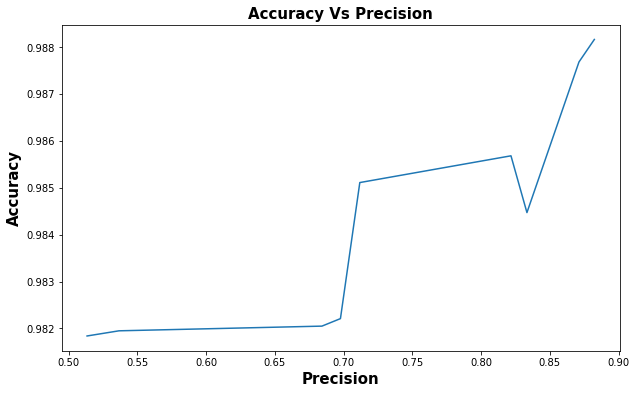

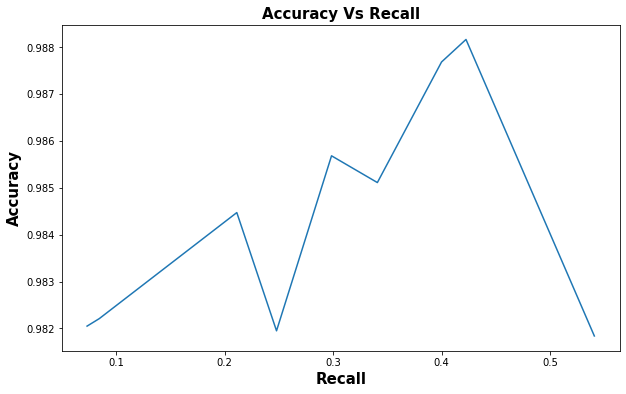

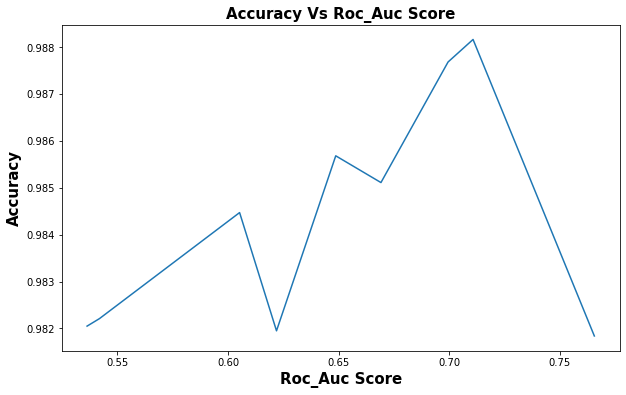

In [75]:
### Accuracy vs Precision and Recall
for feature1 in ['Accuracy']:
    for feature2 in ['Precision', 'Recall', 'Roc_Auc Score']:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_20)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

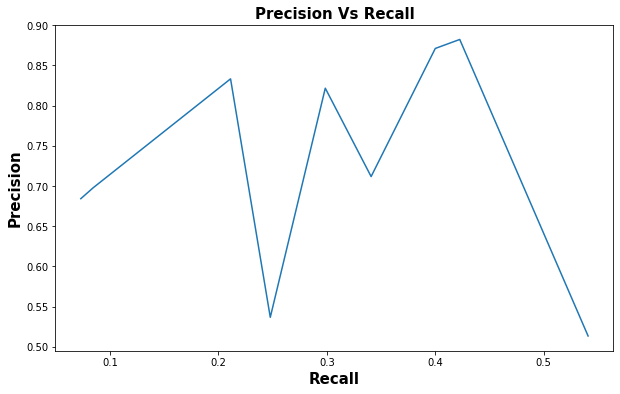

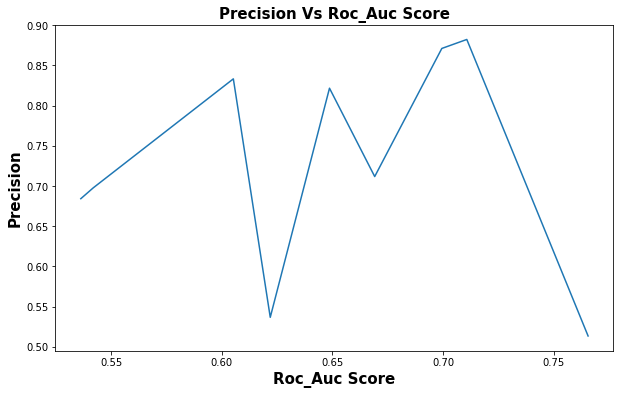

In [76]:
### Precision vs Recall and Roc_Auc Score
for feature1 in ['Precision']:
    for feature2 in [ 'Recall','Roc_Auc Score' ]:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_20)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

### <span style='color:red '>4.6 Fifteen Feature Dataset, Model training and evaluation</span>

In [77]:
### Reducing 170 features to 5 Principal Components(features) using PCA 
X_15=pca_dataframe(X_scaled, 15)1
X_15.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,13.155232,-2.487131,-0.639465,1.350069,-2.817913,2.866422,-2.381773,3.709931,-1.016172,-0.546842,-0.795211,0.380599,2.340527,0.697519,2.157490
1,3.454569,1.661230,-1.791721,1.451455,-3.924357,-1.517954,0.314708,0.847368,0.192531,-1.969976,-1.369809,-2.299370,1.285155,0.471124,0.463480
2,-0.151016,-1.172394,-1.339706,-1.851378,1.924682,0.441298,-0.875587,-1.497734,-0.112471,-0.768431,-1.706954,1.280194,-0.808369,-0.257243,0.042792
3,-8.405538,1.181925,-0.195872,0.116040,-0.019529,0.959081,0.295938,-0.624393,-0.418785,-0.231506,1.417716,0.109451,-0.682392,0.754274,0.551486
4,6.726380,-1.759463,5.228396,-0.812149,0.479616,-1.743924,-2.266651,-0.927077,-2.166194,0.295726,0.501098,0.727139,3.067262,4.022947,-0.508679


In [78]:
### train test split
X_train, X_test, y_train, y_test = train_test_split(X_15, y, test_size=0.25, random_state=19)

In [79]:
### Creating empty list to store model names
model_list=[]
### creating empty list to store accuracy score for each model
acc_score_list=[]
### creating empty list for storing precision score
prec_score_list=[]
### creating list to store recall score
recall_list=[]
### creating list to store roc_auc score
roc_auc_list=[]



### Training all models and getting their performance and storing it in empty list
for num in range(len(list(models))):
    ### selecting model
    model=list(models.values())[num]
    
    ### getting training data prediction and test data prediction
    y_pred, pred_val=model_trainer(model,X_train, y_train, X_test)
    
    ### Getting model performance parameters for training data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_train,y_pred )
    print("{} Model\n".format(list(models.keys())[num]))
    print("Model Performance for training dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    print("-"*50)
    
    ### Getting model performance parameters for test data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_test,pred_val)
    print("Model Performance for Test dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    
    ### Appending model name and Performance score in seperate list so that models can be sorted in terms of performance
    model_list.append(list(models.keys())[num])
    acc_score_list.append(acc_score)
    prec_score_list.append(prec_score)
    recall_list.append(rec_score)
    roc_auc_list.append(roc_auc)
    print("*"*50)
    print("\n")




Logistic Regression Model

Model Performance for training dataset
Accuracy score: 0.98288
Precision Score: 0.7
Recall Score: 0.07549
Roc_Auc Score: 0.53745
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98216
Precision Score: 0.71053
Recall Score: 0.07606
Roc_Auc Score: 0.53773
**************************************************


Support Vector Classifier Model

Model Performance for training dataset
Accuracy score: 0.9863
Precision Score: 0.84638
Recall Score: 0.28627
Roc_Auc Score: 0.64266
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98532
Precision Score: 0.83333
Recall Score: 0.26761
Roc_Auc Score: 0.63329
**************************************************


Decision Tree Classifier Model

Model Performance for training dataset
Accuracy score: 1.0
Precision Score: 1.0
Recall Score: 1.0
Roc_Auc Score: 1.0
--------------------------------------------------
Model Perform

In [80]:
### Tabulating model performance in dataframe
model_perf_15=pd.DataFrame(list(zip(model_list, acc_score_list,prec_score_list, recall_list, roc_auc_list)), columns=['Model', 'Accuracy', 'Precision', 'Recall', 'Roc_Auc Score']).sort_values(by=['Accuracy'], ascending=False,).reset_index()
model_perf_15.drop('index', axis=1, inplace=True)
model_perf_15

,Model,Accuracy,Precision,Recall,Roc_Auc Score
0,Random Forest Classifier,0.98758,0.88889,0.38310,0.69109
1,Extra Tree Classifier,0.98705,0.88652,0.35211,0.67563
2,Support Vector Classifier,0.98532,0.83333,0.26761,0.63329
3,GradientBoost Classifier,0.98500,0.72436,0.31831,0.65800
4,XGBoost Classifier,0.98374,0.78049,0.18028,0.58966
5,Bagging Classifier,0.98221,0.71795,0.07887,0.53914
6,Logistic Regression,0.98216,0.71053,0.07606,0.53773
7,AdaBoost Classifier,0.98168,0.52147,0.23944,0.61763
8,Decision Tree Classifier,0.98032,0.47278,0.46479,0.72746


In [81]:
### saving this dataframe to csv
from google.colab import files
model_perf_15.to_csv('model_perf_15.csv') 
files.download('model_perf_15.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

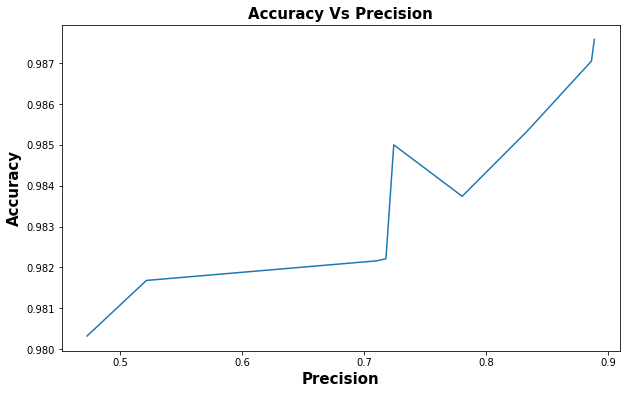

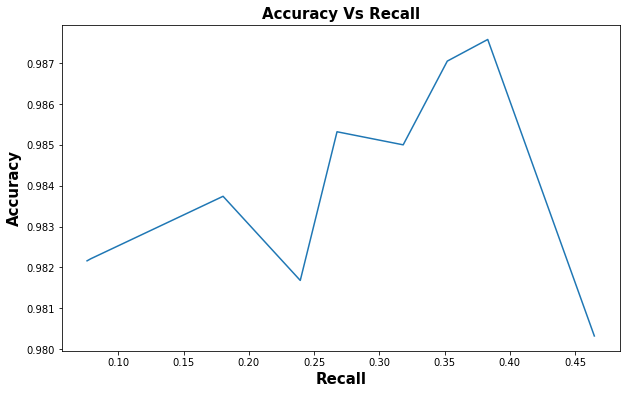

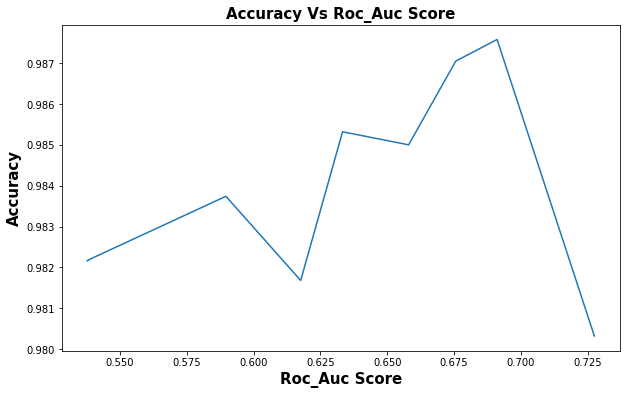

In [82]:
### Accuracy vs Precision and Recall
for feature1 in ['Accuracy']:
    for feature2 in ['Precision', 'Recall', 'Roc_Auc Score']:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_15)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

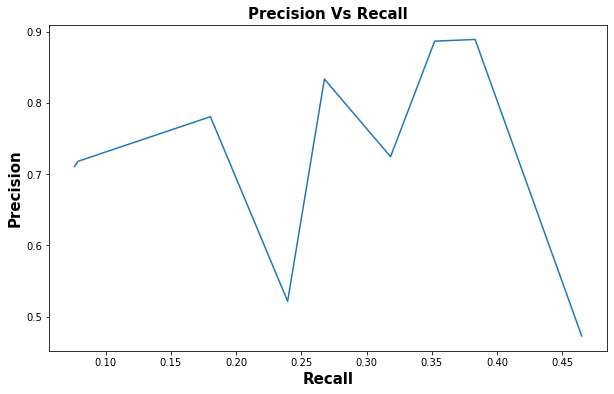

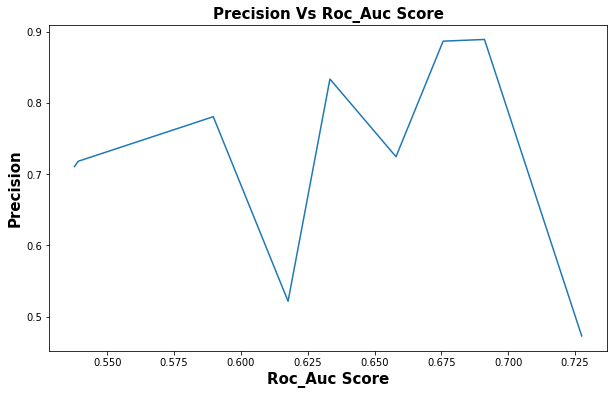

In [83]:
### Precision vs Recall and Roc_Auc Score
for feature1 in ['Precision']:
    for feature2 in [ 'Recall','Roc_Auc Score' ]:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_15)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

### <span style='color:red '>4.7 Ten Feature Dataset, Model training and evaluation</span>

In [84]:
### Reducing 170 features to 10 Principal Components(features) using PCA 
X_10=pca_dataframe(X_scaled, 10)
X_10.head()

,0,1,2,3,4,5,6,7,8,9
0,13.155232,-2.487131,-0.639464,1.350063,-2.818219,2.867162,-2.379576,3.712056,-1.016681,-0.507639
1,3.454569,1.661230,-1.791722,1.451454,-3.924323,-1.518486,0.313427,0.847134,0.188118,-2.010882
2,-0.151016,-1.172394,-1.339706,-1.851367,1.924660,0.441043,-0.876551,-1.499258,-0.114400,-0.781921
3,-8.405538,1.181925,-0.195872,0.116016,-0.019668,0.959249,0.297378,-0.623577,-0.421961,-0.185733
4,6.726380,-1.759464,5.228396,-0.812181,0.479696,-1.742524,-2.263419,-0.924499,-2.157034,0.311494


In [85]:
### train test split
X_train, X_test, y_train, y_test = train_test_split(X_10, y, test_size=0.25, random_state=19)

In [86]:
### Creating empty list to store model names
model_list=[]
### creating empty list to store accuracy score for each model
acc_score_list=[]
### creating empty list for storing precision score
prec_score_list=[]
### creating list to store recall score
recall_list=[]
### creating list to store roc_auc score
roc_auc_list=[]



### Training all models and getting their performance and storing it in empty list
for num in range(len(list(models))):
    ### selecting model
    model=list(models.values())[num]
    
    ### getting training data prediction and test data prediction
    y_pred, pred_val=model_trainer(model,X_train, y_train, X_test)
    
    ### Getting model performance parameters for training data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_train,y_pred )
    print("{} Model\n".format(list(models.keys())[num]))
    print("Model Performance for training dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    print("-"*50)
    
    ### Getting model performance parameters for test data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_test,pred_val)
    print("Model Performance for Test dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    
    ### Appending model name and Performance score in seperate list so that models can be sorted in terms of performance
    model_list.append(list(models.keys())[num])
    acc_score_list.append(acc_score)
    prec_score_list.append(prec_score)
    recall_list.append(rec_score)
    roc_auc_list.append(roc_auc)
    print("*"*50)
    print("\n")




Logistic Regression Model

Model Performance for training dataset
Accuracy score: 0.98211
Precision Score: 0.5
Recall Score: 0.01471
Roc_Auc Score: 0.50722
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98158
Precision Score: 0.72727
Recall Score: 0.02254
Roc_Auc Score: 0.51119
**************************************************


Support Vector Classifier Model

Model Performance for training dataset
Accuracy score: 0.98323
Precision Score: 0.88095
Recall Score: 0.07255
Roc_Auc Score: 0.53619
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98221
Precision Score: 0.7931
Recall Score: 0.06479
Roc_Auc Score: 0.53223
**************************************************


Decision Tree Classifier Model

Model Performance for training dataset
Accuracy score: 1.0
Precision Score: 1.0
Recall Score: 1.0
Roc_Auc Score: 1.0
--------------------------------------------------
Model Perform

In [87]:
### Tabulating model performance in dataframe
model_perf_10=pd.DataFrame(list(zip(model_list, acc_score_list,prec_score_list, recall_list, roc_auc_list)), columns=['Model', 'Accuracy', 'Precision', 'Recall', 'Roc_Auc Score']).sort_values(by=['Accuracy'], ascending=False,).reset_index()
model_perf_10.drop('index', axis=1, inplace=True)
model_perf_10

,Model,Accuracy,Precision,Recall,Roc_Auc Score
0,Random Forest Classifier,0.98716,0.83636,0.38873,0.69364
1,Extra Tree Classifier,0.98642,0.82119,0.34930,0.67392
2,GradientBoost Classifier,0.98389,0.67133,0.27042,0.63395
3,XGBoost Classifier,0.98305,0.72603,0.14930,0.57411
4,Support Vector Classifier,0.98221,0.79310,0.06479,0.53223
5,Logistic Regression,0.98158,0.72727,0.02254,0.51119
6,Bagging Classifier,0.98153,0.66667,0.02254,0.51116
7,AdaBoost Classifier,0.98089,0.46875,0.16901,0.58268
8,Decision Tree Classifier,0.98037,0.47554,0.49296,0.74130


In [88]:
### saving this dataframe to csv
from google.colab import files
model_perf_10.to_csv('model_perf_10.csv') 
files.download('model_perf_10.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

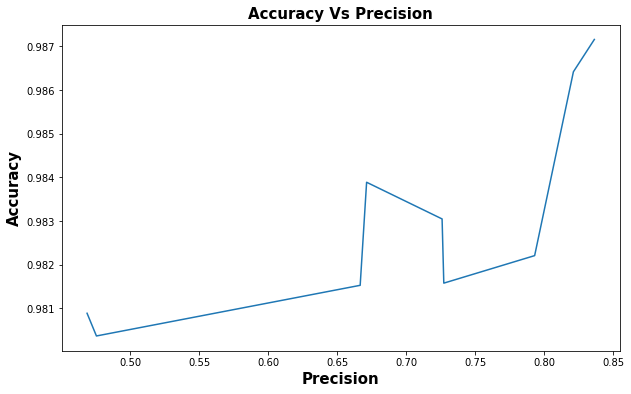

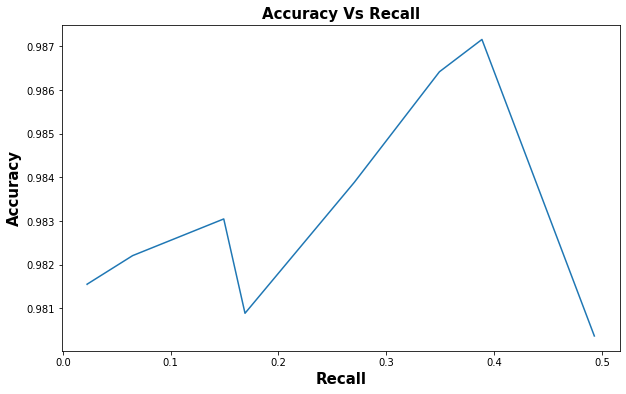

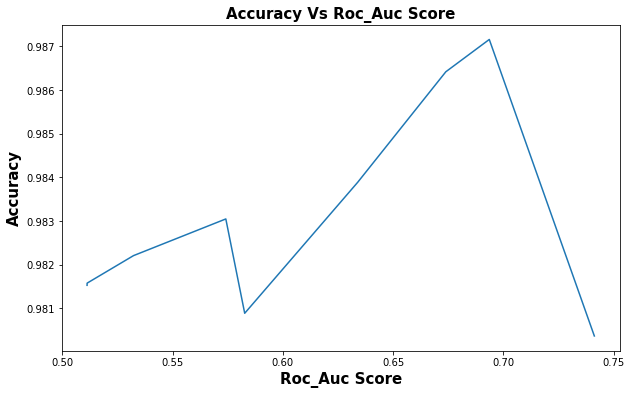

In [89]:
### Accuracy vs Precision and Recall
for feature1 in ['Accuracy']:
    for feature2 in ['Precision', 'Recall', 'Roc_Auc Score']:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_10)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

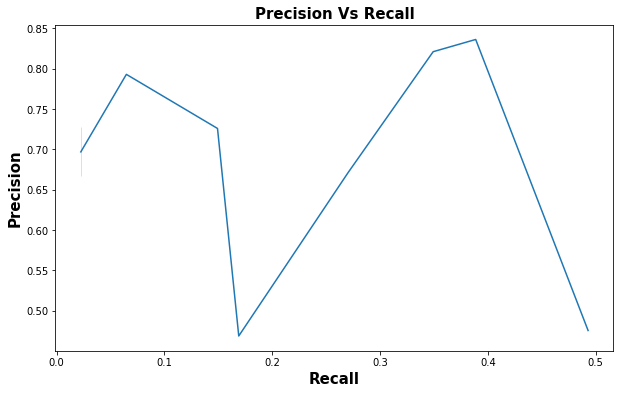

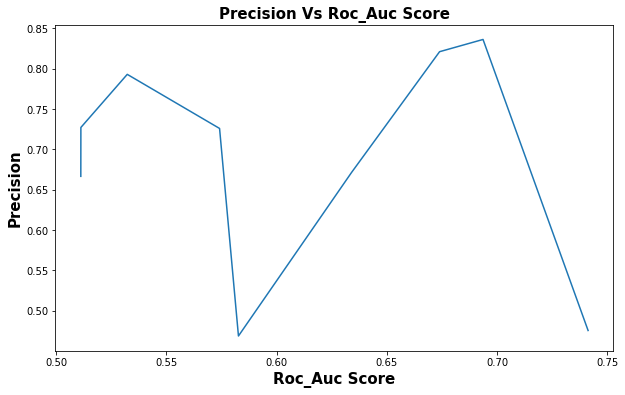

In [90]:
### Precision vs Recall and Roc_Auc Score
for feature1 in ['Precision']:
    for feature2 in [ 'Recall','Roc_Auc Score' ]:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_10)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

### <span style='color:red '>4.8 Five Feature Dataset, Model training and evaluation</span>

In [91]:
### Reducing 170 features to 5 Principal Components(features) using PCA 
X_5=pca_dataframe(X_scaled, 5)
X_5.head()

,0,1,2,3,4
0,13.155232,-2.487131,-0.639465,1.349983,-2.818011
1,3.454569,1.661230,-1.791721,1.451567,-3.924594
2,-0.151016,-1.172394,-1.339706,-1.851389,1.924753
3,-8.405538,1.181925,-0.195872,0.115794,-0.019287
4,6.726380,-1.759464,5.228397,-0.812520,0.480640


In [92]:
### train test split
X_train, X_test, y_train, y_test = train_test_split(X_5, y, test_size=0.25, random_state=19)

In [93]:
### Creating empty list to store model names
model_list=[]
### creating empty list to store accuracy score for each model
acc_score_list=[]
### creating empty list for storing precision score
prec_score_list=[]
### creating list to store recall score
recall_list=[]
### creating list to store roc_auc score
roc_auc_list=[]



### Training all models and getting their performance and storing it in empty list
for num in range(len(list(models))):
    ### selecting model
    model=list(models.values())[num]
    
    ### getting training data prediction and test data prediction
    y_pred, pred_val=model_trainer(model,X_train, y_train, X_test)
    
    ### Getting model performance parameters for training data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_train,y_pred )
    print("{} Model\n".format(list(models.keys())[num]))
    print("Model Performance for training dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    print("-"*50)
    
    ### Getting model performance parameters for test data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_test,pred_val)
    print("Model Performance for Test dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    
    ### Appending model name and Performance score in seperate list so that models can be sorted in terms of performance
    model_list.append(list(models.keys())[num])
    acc_score_list.append(acc_score)
    prec_score_list.append(prec_score)
    recall_list.append(rec_score)
    roc_auc_list.append(roc_auc)
    print("*"*50)
    print("\n")




Logistic Regression Model

Model Performance for training dataset
Accuracy score: 0.982
Precision Score: 0.25
Recall Score: 0.00294
Roc_Auc Score: 0.50139
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98126
Precision Score: 0.33333
Recall Score: 0.00282
Roc_Auc Score: 0.50135
**************************************************


Support Vector Classifier Model

Model Performance for training dataset
Accuracy score: 0.98211
Precision Score: 0.0
Recall Score: 0.0
Roc_Auc Score: 0.5
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98132
Precision Score: 0.0
Recall Score: 0.0
Roc_Auc Score: 0.5
**************************************************


Decision Tree Classifier Model

Model Performance for training dataset
Accuracy score: 1.0
Precision Score: 1.0
Recall Score: 1.0
Roc_Auc Score: 1.0
--------------------------------------------------
Model Performance for Test dataset
Ac

In [94]:
### Tabulating model performance in dataframe
model_perf_5=pd.DataFrame(list(zip(model_list, acc_score_list,prec_score_list, recall_list, roc_auc_list)), columns=['Model', 'Accuracy', 'Precision', 'Recall', 'Roc_Auc Score']).sort_values(by=['Accuracy'], ascending=False,).reset_index()
model_perf_5.drop('index', axis=1, inplace=True)
model_perf_5

,Model,Accuracy,Precision,Recall,Roc_Auc Score
0,Extra Tree Classifier,0.98500,0.70833,0.33521,0.66629
1,Random Forest Classifier,0.98484,0.68927,0.34366,0.67036
2,GradientBoost Classifier,0.98268,0.64130,0.16620,0.58221
3,XGBoost Classifier,0.98221,0.72973,0.07606,0.53776
4,Support Vector Classifier,0.98132,0.00000,0.00000,0.50000
5,Logistic Regression,0.98126,0.33333,0.00282,0.50135
6,Bagging Classifier,0.98126,0.00000,0.00000,0.49997
7,AdaBoost Classifier,0.98111,0.47674,0.11549,0.55654
8,Decision Tree Classifier,0.97784,0.41033,0.42535,0.70686


In [95]:
### saving this dataframe to csv
from google.colab import files
model_perf_5.to_csv('model_perf_5.csv') 
files.download('model_perf_5.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

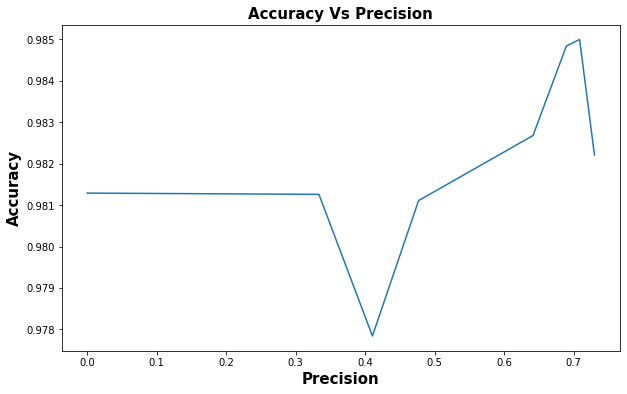

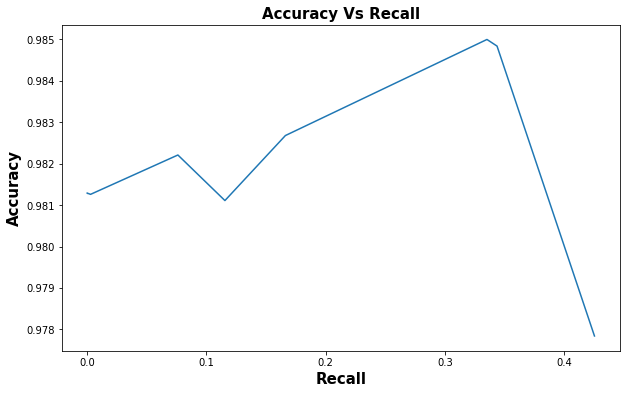

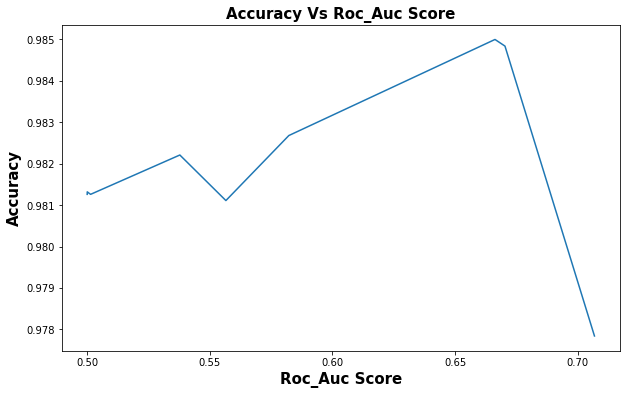

In [96]:
### Accuracy vs Precision and Recall
for feature1 in ['Accuracy']:
    for feature2 in ['Precision', 'Recall', 'Roc_Auc Score']:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_5)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

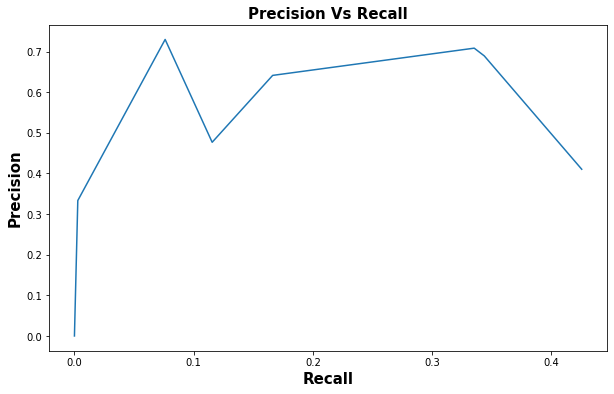

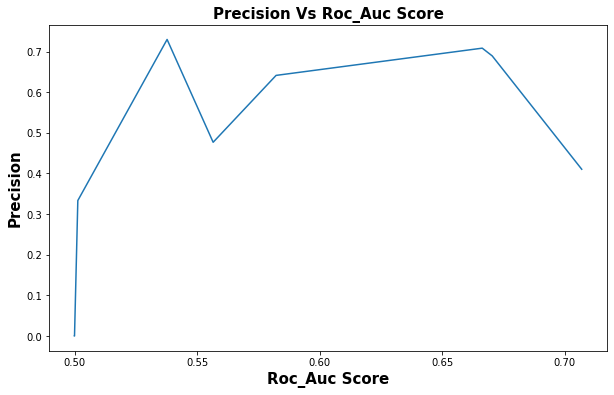

In [97]:
### Precision vs Recall and Roc_Auc Score
for feature1 in ['Precision']:
    for feature2 in [ 'Recall','Roc_Auc Score' ]:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_5)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

### <span style='color:red '>4.9 Two Feature Dataset, Model training and evaluation</span>

In [99]:
### Reducing 170 features to 2 Principal Components(features) using PCA 
X_2=pca_dataframe(X_scaled, 2)
X_2.head()

,0,1
0,13.155232,-2.487132
1,3.454569,1.661230
2,-0.151016,-1.172393
3,-8.405538,1.181925
4,6.726380,-1.759465


In [100]:
### train test split
X_train, X_test, y_train, y_test = train_test_split(X_2, y, test_size=0.25, random_state=19)

In [101]:
### Creating empty list to store model names
model_list=[]
### creating empty list to store accuracy score for each model
acc_score_list=[]
### creating empty list for storing precision score
prec_score_list=[]
### creating list to store recall score
recall_list=[]
### creating list to store roc_auc score
roc_auc_list=[]



### Training all models and getting their performance and storing it in empty list
for num in range(len(list(models))):
    ### selecting model
    model=list(models.values())[num]
    
    ### getting training data prediction and test data prediction
    y_pred, pred_val=model_trainer(model,X_train, y_train, X_test)
    
    ### Getting model performance parameters for training data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_train,y_pred )
    print("{} Model\n".format(list(models.keys())[num]))
    print("Model Performance for training dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    print("-"*50)
    
    ### Getting model performance parameters for test data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_test,pred_val)
    print("Model Performance for Test dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    
    ### Appending model name and Performance score in seperate list so that models can be sorted in terms of performance
    model_list.append(list(models.keys())[num])
    acc_score_list.append(acc_score)
    prec_score_list.append(prec_score)
    recall_list.append(rec_score)
    roc_auc_list.append(roc_auc)
    print("*"*50)
    print("\n")




Logistic Regression Model

Model Performance for training dataset
Accuracy score: 0.98205
Precision Score: 0.0
Recall Score: 0.0
Roc_Auc Score: 0.49997
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98132
Precision Score: 0.0
Recall Score: 0.0
Roc_Auc Score: 0.5
**************************************************


Support Vector Classifier Model

Model Performance for training dataset
Accuracy score: 0.98211
Precision Score: 0.0
Recall Score: 0.0
Roc_Auc Score: 0.5
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98132
Precision Score: 0.0
Recall Score: 0.0
Roc_Auc Score: 0.5
**************************************************


Decision Tree Classifier Model

Model Performance for training dataset
Accuracy score: 1.0
Precision Score: 1.0
Recall Score: 1.0
Roc_Auc Score: 1.0
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0

In [102]:
### Tabulating model performance in dataframe
model_perf_2=pd.DataFrame(list(zip(model_list, acc_score_list,prec_score_list, recall_list, roc_auc_list)), columns=['Model', 'Accuracy', 'Precision', 'Recall', 'Roc_Auc Score']).sort_values(by=['Accuracy'], ascending=False,).reset_index()
model_perf_2.drop('index', axis=1, inplace=True)
model_perf_2

,Model,Accuracy,Precision,Recall,Roc_Auc Score
0,Random Forest Classifier,0.98242,0.55932,0.27887,0.63734
1,AdaBoost Classifier,0.98168,0.62963,0.04789,0.52368
2,Extra Tree Classifier,0.98137,0.50262,0.27042,0.63266
3,Logistic Regression,0.98132,0.00000,0.00000,0.50000
4,Support Vector Classifier,0.98132,0.00000,0.00000,0.50000
5,Bagging Classifier,0.98132,0.00000,0.00000,0.50000
6,XGBoost Classifier,0.98126,0.42857,0.00845,0.50412
7,GradientBoost Classifier,0.98111,0.44737,0.04789,0.52338
8,Decision Tree Classifier,0.97558,0.34648,0.34648,0.66702


In [103]:
### saving this dataframe to csv
from google.colab import files
model_perf_2.to_csv('model_perf_2.csv') 
files.download('model_perf_2.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

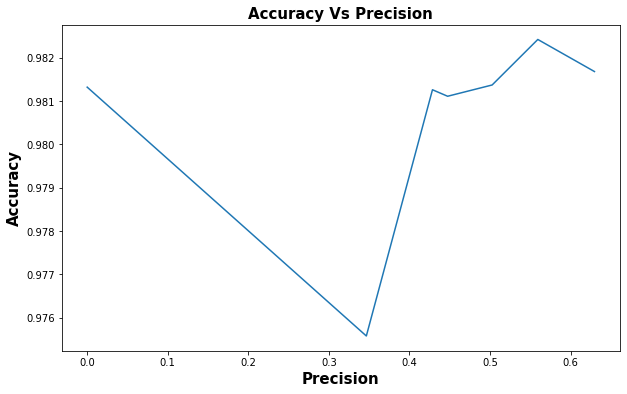

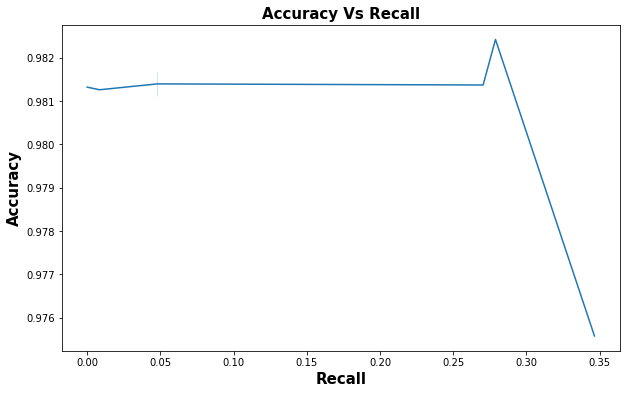

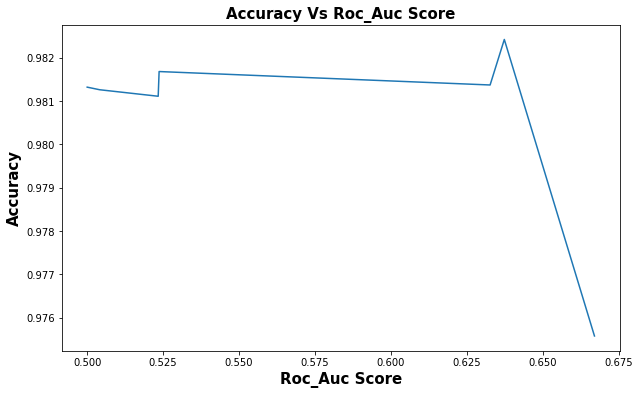

In [104]:
### Accuracy vs Precision and Recall
for feature1 in ['Accuracy']:
    for feature2 in ['Precision', 'Recall', 'Roc_Auc Score']:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_2)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

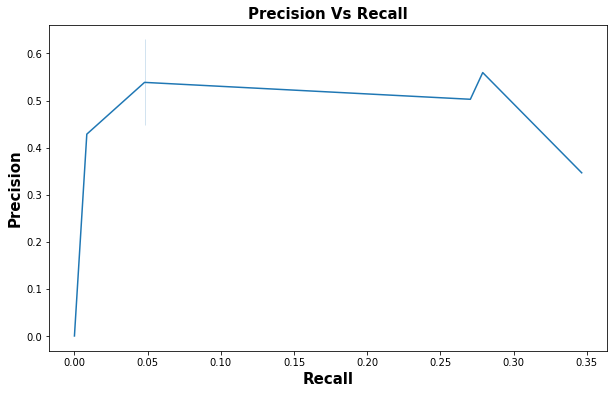

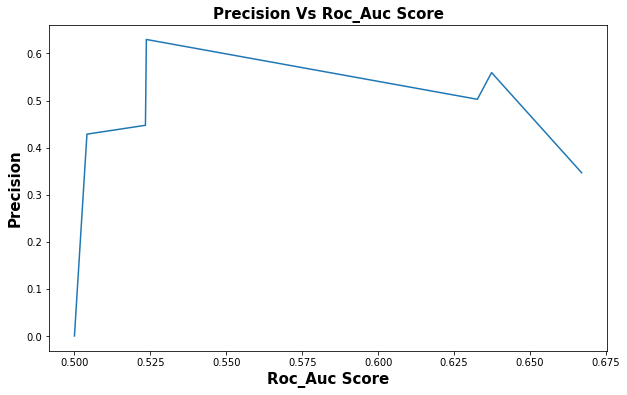

In [105]:
### Precision vs Recall and Roc_Auc Score
for feature1 in ['Precision']:
    for feature2 in [ 'Recall','Roc_Auc Score' ]:
        plt.figure(figsize=(10,6))
        sns.lineplot(y=feature1, x=feature2, data=model_perf_2)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("{} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

### <span style='color:red '>4.10 Hyper-Parameter tuning the Model, Re-training and evaluation</span>

In [30]:
### using 10 principal component dataset as it has better ROC_AUC_scores and as the PC decreases ROC_AUC_scores decreases 
X_10.head()

,0,1,2,3,4,5,6,7,8,9
0,13.155232,-2.487131,-0.639464,1.350152,-2.817993,2.865499,-2.382117,3.712997,-1.000738,-0.509945
1,3.454569,1.661230,-1.791722,1.451516,-3.924438,-1.517734,0.311288,0.849830,0.202754,-1.964828
2,-0.151016,-1.172394,-1.339706,-1.851363,1.924697,0.441416,-0.874976,-1.498410,-0.113396,-0.775728
3,-8.405538,1.181925,-0.195872,0.115913,-0.019404,0.959789,0.297849,-0.627137,-0.430224,-0.259192
4,6.726380,-1.759463,5.228396,-0.811638,0.479080,-1.745793,-2.282590,-0.913336,-2.114566,0.406897


### <span style='color:blue '>Observation</span>
1. Using top 4 models for hyper-parameter tuning

In [31]:
### train test split
X_train, X_test, y_train, y_test = train_test_split(X_10, y, test_size=0.25, random_state=19)

In [32]:
### Hyper-Parameters for different algorithms
rfc_params={'n_estimators':[100,200, 300],
           'max_depth': [None, 5,10],
           'min_samples_leaf': [5,10,15]}

etc_params={'n_estimators':[100,200, 300],
           'max_depth': [None, 5,10],
           'min_samples_leaf': [5,10,15]}

gbc_params={'criterion': ['friedman_mse', 'squared_error', 'mse'],
            'n_estimators':[100,200, 300],
            'min_samples_split': [20,30,40]}

xgbc_params={'max_depth': [2,4,6],
            'min_child_weight': [2,4,6],
            'gamma': [i/10 for i in range(4)]}

### <span style='color:red '>4.10.1 Hyper-Parameter tuning the Gradient Boosting Classifier Model</span>

In [33]:
### creating empty dictionary to store best parameters
model_param={}

In [35]:
### HPT Gradient Boosting Classifier Model
model=GradientBoostingClassifier()
grid=GridSearchCV(estimator=model,param_grid=gbc_params, cv=2,  verbose=2)
grid.fit(X_train, y_train)
model_param['Gradient Boosting Classifier']=grid.best_params_

Fitting 2 folds for each of 27 candidates, totalling 54 fits
[CV] END criterion=friedman_mse, min_samples_split=20, n_estimators=100; total time=  12.6s
[CV] END criterion=friedman_mse, min_samples_split=20, n_estimators=100; total time=  12.6s
[CV] END criterion=friedman_mse, min_samples_split=20, n_estimators=200; total time=  25.2s
[CV] END criterion=friedman_mse, min_samples_split=20, n_estimators=200; total time=  25.2s
[CV] END criterion=friedman_mse, min_samples_split=20, n_estimators=300; total time=  37.7s
[CV] END criterion=friedman_mse, min_samples_split=20, n_estimators=300; total time=  37.7s
[CV] END criterion=friedman_mse, min_samples_split=30, n_estimators=100; total time=  13.4s
[CV] END criterion=friedman_mse, min_samples_split=30, n_estimators=100; total time=  12.5s
[CV] END criterion=friedman_mse, min_samples_split=30, n_estimators=200; total time=  25.1s
[CV] END criterion=friedman_mse, min_samples_split=30, n_estimators=200; total time=  25.0s
[CV] END criterion=

### <span style='color:red '>4.10.2 Hyper-Parameter tuning the Extra Tree Classifier Model</span>

In [36]:
### HPT Extra Tree Classifier Model
model=ExtraTreesClassifier()
grid=GridSearchCV(estimator=model,param_grid=etc_params, cv=2,  verbose=2)
grid.fit(X_train, y_train)
model_param['Extra Tree Classifier']=grid.best_params_

Fitting 2 folds for each of 27 candidates, totalling 54 fits
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=100; total time=   1.5s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=100; total time=   1.5s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=200; total time=   3.0s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=200; total time=   3.0s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=300; total time=   4.5s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=300; total time=   4.4s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=100; total time=   1.4s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=100; total time=   1.4s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=200; total time=   2.9s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=200; total time=   2.8s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=300; total time=   4.2s
[CV] END max_depth=None, min_sam

### <span style='color:red '>4.10.3 Hyper-Parameter tuning the XGBoost Classifier Model</span>

In [37]:
### HPT XGBoost Classifier Model
model=XGBClassifier()
grid=GridSearchCV(estimator=model,param_grid=xgbc_params, cv=2,  verbose=2)
grid.fit(X_train, y_train)
model_param['XGBoost Classifier']=grid.best_params_

Fitting 2 folds for each of 36 candidates, totalling 72 fits
[CV] END .........gamma=0.0, max_depth=2, min_child_weight=2; total time=   1.9s
[CV] END .........gamma=0.0, max_depth=2, min_child_weight=2; total time=   1.9s
[CV] END .........gamma=0.0, max_depth=2, min_child_weight=4; total time=   1.8s
[CV] END .........gamma=0.0, max_depth=2, min_child_weight=4; total time=   1.8s
[CV] END .........gamma=0.0, max_depth=2, min_child_weight=6; total time=   1.8s
[CV] END .........gamma=0.0, max_depth=2, min_child_weight=6; total time=   1.8s
[CV] END .........gamma=0.0, max_depth=4, min_child_weight=2; total time=   3.2s
[CV] END .........gamma=0.0, max_depth=4, min_child_weight=2; total time=   3.2s
[CV] END .........gamma=0.0, max_depth=4, min_child_weight=4; total time=   3.1s
[CV] END .........gamma=0.0, max_depth=4, min_child_weight=4; total time=   3.1s
[CV] END .........gamma=0.0, max_depth=4, min_child_weight=6; total time=   3.1s
[CV] END .........gamma=0.0, max_depth=4, min_ch

### <span style='color:red '>4.10.4 Hyper-Parameter tuning the Random Forest Classifier Model</span>

In [38]:
### HPT Random Forest Classifier Model
model=RandomForestClassifier()
grid=GridSearchCV(estimator=model,param_grid=rfc_params, cv=2,  verbose=2)
grid.fit(X_train, y_train)
model_param['Random Forest Classifier']=grid.best_params_

Fitting 2 folds for each of 27 candidates, totalling 54 fits
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=100; total time=  11.1s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=100; total time=  11.1s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=200; total time=  22.1s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=200; total time=  21.3s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=300; total time=  33.3s
[CV] END max_depth=None, min_samples_leaf=5, n_estimators=300; total time=  31.6s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=100; total time=  10.7s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=100; total time=  10.9s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=200; total time=  21.3s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=200; total time=  20.0s
[CV] END max_depth=None, min_samples_leaf=10, n_estimators=300; total time=  32.2s
[CV] END max_depth=None, min_sam

### <span style='color:red '>4.10.5 Best Parameters for Hyper-tuned Models</span>

In [39]:
### Printing best hyper parameter for different models
for model_name in model_param:
    print("Best param for {} is {}".format(model_name, model_param[model_name]))
    print(model_param[model_name])

Best param for Gradient Boosting Classifier is {'criterion': 'friedman_mse', 'min_samples_split': 20, 'n_estimators': 100}
{'criterion': 'friedman_mse', 'min_samples_split': 20, 'n_estimators': 100}
Best param for Extra Tree Classifier is {'max_depth': None, 'min_samples_leaf': 5, 'n_estimators': 300}
{'max_depth': None, 'min_samples_leaf': 5, 'n_estimators': 300}
Best param for XGBoost Classifier is {'gamma': 0.3, 'max_depth': 6, 'min_child_weight': 2}
{'gamma': 0.3, 'max_depth': 6, 'min_child_weight': 2}
Best param for Random Forest Classifier is {'max_depth': None, 'min_samples_leaf': 5, 'n_estimators': 300}
{'max_depth': None, 'min_samples_leaf': 5, 'n_estimators': 300}


### <span style='color:red '>4.11 Re-training Models with Best Hyper_parameters and Model evaluation</span>

In [41]:
### Creating models list containing models with hyper-parameters
models={
    "Random Forest Classifier": RandomForestClassifier(**model_param['Random Forest Classifier']),
    "Extra Tree Classifier": ExtraTreesClassifier(**model_param['Extra Tree Classifier']),
    "Gradient Boost Classifier": GradientBoostingClassifier(**model_param['Gradient Boosting Classifier']),
    "XGBoost Classifier": XGBClassifier(**model_param['XGBoost Classifier'])
}

In [44]:
### Creating empty list to store model names
model_list=[]
### creating empty list to store accuracy score for each model
acc_score_list=[]
### creating empty list for storing precision score
prec_score_list=[]
### creating list to store recall score
recall_list=[]
### creating list to store roc_auc score
roc_auc_list=[]


### Training all models and getting their performance and storing it in empty list
for num in range(len(list(models))):
    ### selecting model
    model=list(models.values())[num]
    
    ### getting training data prediction and test data prediction
    y_pred, pred_val=model_trainer(model,X_train, y_train, X_test)
    
    ### Getting model performance parameters for training data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_train,y_pred )
    print("{} Model\n".format(list(models.keys())[num]))
    print("Model Performance for training dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    print("-"*50)
    
    ### Getting model performance parameters for test data
    acc_score, prec_score, rec_score, roc_auc=model_evaluator(y_test,pred_val)
    print("Model Performance for Test dataset")
    print("Accuracy score: {}\nPrecision Score: {}\nRecall Score: {}\nRoc_Auc Score: {}".format(acc_score,prec_score, rec_score, roc_auc))
    
    ### Appending model name and Performance score in seperate list so that models can be sorted in terms of performance
    model_list.append(list(models.keys())[num])
    acc_score_list.append(acc_score)
    prec_score_list.append(prec_score)
    recall_list.append(rec_score)
    roc_auc_list.append(roc_auc)
    print("*"*50)
    print("\n")




Random Forest Classifier Model

Model Performance for training dataset
Accuracy score: 0.99214
Precision Score: 0.98311
Recall Score: 0.57059
Roc_Auc Score: 0.7852
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98553
Precision Score: 0.82787
Recall Score: 0.28451
Roc_Auc Score: 0.64169
**************************************************


Extra Tree Classifier Model

Model Performance for training dataset
Accuracy score: 0.98618
Precision Score: 0.97541
Recall Score: 0.23333
Roc_Auc Score: 0.61661
--------------------------------------------------
Model Performance for Test dataset
Accuracy score: 0.98374
Precision Score: 0.89655
Recall Score: 0.14648
Roc_Auc Score: 0.57308
**************************************************


Gradient Boost Classifier Model

Model Performance for training dataset
Accuracy score: 0.98691
Precision Score: 0.82311
Recall Score: 0.34216
Roc_Auc Score: 0.67041
------------------------------------------

In [45]:
### Tabulating model performance in dataframe
model_perf_hpt=pd.DataFrame(list(zip(model_list, acc_score_list,prec_score_list, recall_list, roc_auc_list)), columns=['Model', 'Accuracy', 'Precision', 'Recall', 'Roc_Auc Score']).sort_values(by=['Accuracy'], ascending=False,).reset_index()
model_perf_hpt.drop('index', axis=1, inplace=True)
model_perf_hpt

,Model,Accuracy,Precision,Recall,Roc_Auc Score
0,XGBoost Classifier,0.98584,0.75904,0.35493,0.67639
1,Random Forest Classifier,0.98553,0.82787,0.28451,0.64169
2,Gradient Boost Classifier,0.98389,0.67376,0.26761,0.63257
3,Extra Tree Classifier,0.98374,0.89655,0.14648,0.57308


In [121]:
### Getting top four base models for 10 principal component dataset
model_per_10_top_4=model_perf_10.loc[:3]
model_per_10_top_4

,Model,Accuracy,Precision,Recall,Roc_Auc Score
0,Random Forest Classifier,0.98716,0.83636,0.38873,0.69364
1,Extra Tree Classifier,0.98642,0.82119,0.34930,0.67392
2,GradientBoost Classifier,0.98389,0.67133,0.27042,0.63395
3,XGBoost Classifier,0.98305,0.72603,0.14930,0.57411


In [106]:
### saving this dataframe to csv
from google.colab import files
model_perf_hpt.to_csv('model_perf_hpt.csv') 
files.download('model_perf_hpt.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### <span style='color:red '>4.12 Comparing Performances of Base Models with Hyper-Tuned Models</span>

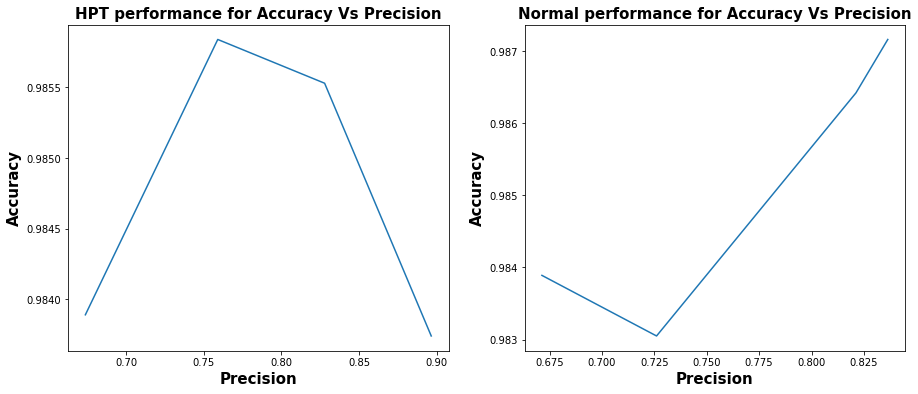

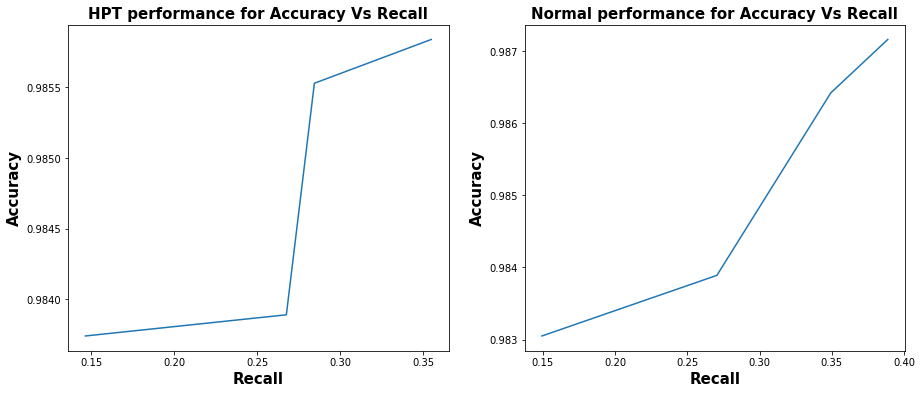

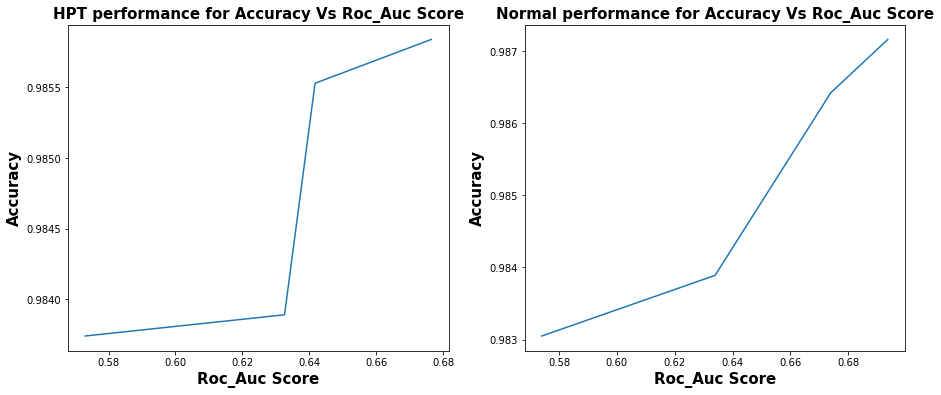

In [122]:
### Accuracy vs Precision and Recall for HPT Model and base Model
for feature1 in ['Accuracy']:
    for feature2 in ['Precision', 'Recall', 'Roc_Auc Score']:
        plt.figure(figsize=(15,6))
        plt.subplot(121)
        sns.lineplot(y=feature1, x=feature2, data=model_perf_hpt)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("HPT performance for {} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

        plt.subplot(122)
        sns.lineplot(y=feature1, x=feature2, data=model_per_10_top_4)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("Normal performance for {} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)



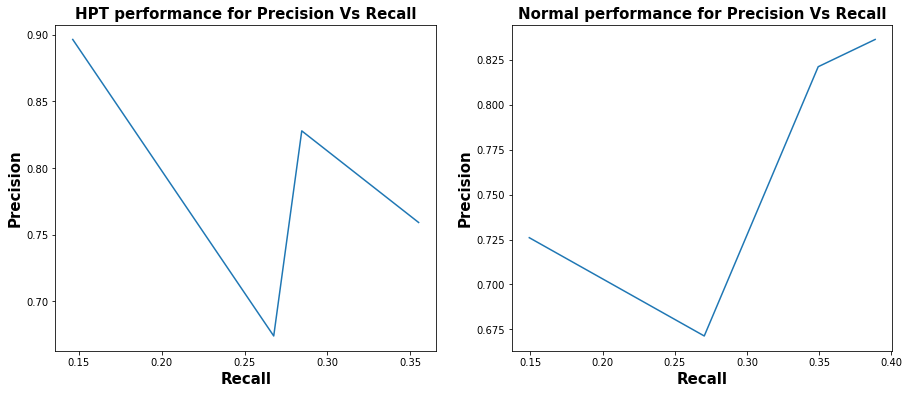

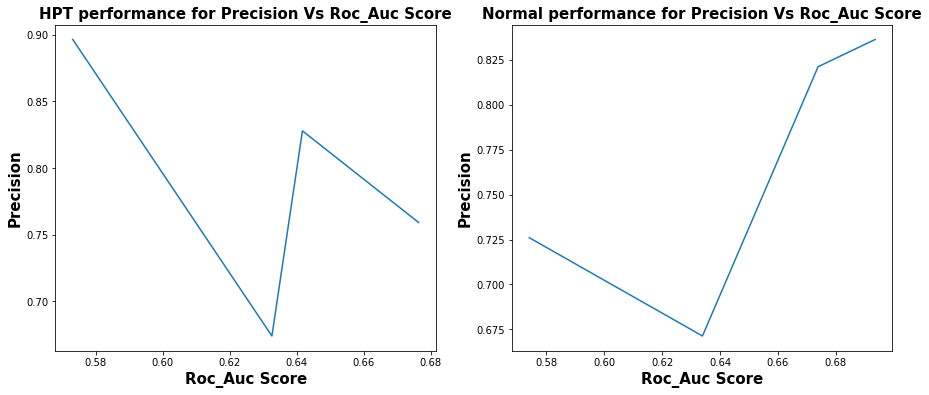

In [123]:
### Precision vs Recall and Roc_Auc Score for HPT Model and base Model
for feature1 in ['Precision']:
    for feature2 in [ 'Recall','Roc_Auc Score' ]:
        plt.figure(figsize=(15,6))
        plt.subplot(121)
        sns.lineplot(y=feature1, x=feature2, data=model_perf_hpt)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("HPT performance for {} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)

        plt.subplot(122)
        sns.lineplot(y=feature1, x=feature2, data=model_per_10_top_4)
        plt.xlabel("{}".format(feature2), fontweight='bold', fontsize=15)
        plt.ylabel("{}".format(feature1), fontweight='bold', fontsize=15)
        plt.title("Normal performance for {} Vs {}".format(feature1, feature2), fontweight='bold', fontsize=15)